# Minecraft Mob Detection

## Описание проекта

**Цель**: Разработка системы автоматической детекции персонажей (мобов) в игровом мире Minecraft с использованием современных архитектур FCOS и YOLOv8.

**Основные задачи**:
1. Провести исследовательский анализ датасета (EDA) и оценить распределение классов
2. Преобразовать аннотации из формата Pascal VOC XML в форматы MMDetection (COCO JSON) и YOLO
3. Дообучить модели FCOS и YOLOv8 на датасете Minecraft
4. Сравнить производительность моделей по метрикам качества (mAP, Precision, Recall, F1) и скорости (FPS)

**О датасете**:  
Датасет содержит **17 классов мобов**:

```
CLASSES = [
'bee', 'chicken', 'cow', 'creeper', 'enderman', 'fox', 'frog', 'ghast',
'goat', 'llama', 'pig', 'sheep', 'skeleton', 'spider', 'turtle', 'wolf', 'zombie'
]
```


**Источники данных**:
- Исходный формат: Pascal VOC XML (предоставлен в ТЗ)
- Готовые форматы YOLO и COCO JSON: [Roboflow Universe](https://universe.roboflow.com/minecraft-object-detection/minecraft-mob-detection/dataset/10)

---



## Содержание

1. [Подготовка окружения и данных](#1-подготовка-окружения-и-данных)
2. [Разведочный анализ (EDA)](#2-разведочный-анализ-eda)
3. [Инференс без обучения](#3-инференс-без-обучения)
4. [Настройка и Обучение FCOS](#4-настройка-и-обучение-fcos)
5. [Настройка и Обучение YOLO](#5-настройка-и-обучение-yolo)
6. [Инференс моделей на тестовых данных](#6-инференс-моделей-на-тестовых-данных)
7. [Сравнительный анализ](#7-сравнительный-анализ)
8. [Заключение](#8-заключение)

---


## 1 Подготовка окружения и данных

In [1]:
# ============================================================================
# ГЛОБАЛЬНЫЙ КОНФИГ (Всегда запускать)
# ============================================================================

# --- 1. Настройка окружения Python ---
import os
import sys
import warnings

# Добавляем mmdetection в путь, если он лежит в папке проекта
if os.path.exists('mmdetection'):
    sys.path.insert(0, 'mmdetection')


# --- 2. Стандартные библиотеки ---
import json
import random
import time
import shutil
import xml.etree.ElementTree as ET
from collections import Counter
from pathlib import Path
from typing import Any, Dict, List, Optional, Tuple


# --- 3. Обработка данных и визуализация ---
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
from tqdm.auto import tqdm


# --- 4. Deep Learning (Torch) ---
import torch


# --- 5. MMDetection & MMEngine (FCOS) ---
try:
    import mmcv
    from mmcv import VideoReader
    from mmcv.transforms import Compose

    from mmengine.config import Config
    from mmengine.runner import Runner
    from mmengine.registry import VISUALIZERS

    from mmdet.apis import init_detector, inference_detector, DetInferencer
    from mmdet.utils import register_all_modules, setup_cache_size_limit_of_dynamo
except ImportError as e:
    print(f"⚠ MMDetection/MMEngine components not found: {e}")


# --- 6. Ultralytics (YOLO) ---
try:
    from ultralytics import YOLO
except ImportError:
    print("⚠ Ultralytics YOLO not found. Run: pip install ultralytics")


# --- 7. ClearML (Experiment Tracking) ---
try:
    from clearml import Task
    CLEARML_AVAILABLE = True
except ImportError:
    print("⚠ ClearML not found. Run: pip install clearml")
    CLEARML_AVAILABLE = False
    Task = None


# --- 8. Настройки (Seed, Plotting, Device) ---
warnings.filterwarnings('ignore')

# Визуализация
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 10
sns.set_palette("muted")

# Фиксация Random Seed
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Устройство
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# --- 9. Пути к данным ---
PROJECT_ROOT = Path('.')
DATA_ROOT = PROJECT_ROOT / 'datasets' / 'minecraft'

# Внутри датасета
DATASET_ROOT = DATA_ROOT
ANNOTATIONS_DIR = DATASET_ROOT / 'annotations'
TEST_IMAGES_DIR = DATASET_ROOT / 'test'

# Артефакты (результаты)
ARTIFACTS_ROOT = PROJECT_ROOT / 'artifacts'
CHECKPOINTS_DIR = ARTIFACTS_ROOT / 'checkpoints'
INFERENCE_DIR = ARTIFACTS_ROOT / 'inference'
METRICS_DIR = ARTIFACTS_ROOT / 'metrics'

# --- 10. Константы Датасета ---
# Имена сплитов
TRAIN_SPLIT = 'train'
VALID_SPLIT = 'valid'  # Исходное имя (Roboflow)
VAL_SPLIT = 'val'      # Целевое имя (MMDetection)
TEST_SPLIT = 'test'
SPLITS = [TRAIN_SPLIT, VALID_SPLIT, TEST_SPLIT]

# Классы
MINECRAFT_CLASSES = (
    'bee', 'chicken', 'cow', 'creeper', 'enderman', 'fox', 'frog',
    'ghast', 'goat', 'llama', 'pig', 'sheep', 'skeleton', 'spider',
    'turtle', 'wolf', 'zombie'
)
NUM_CLASSES = len(MINECRAFT_CLASSES)

# Словари маппинга
CLASS_TO_ID = {cls: idx for idx, cls in enumerate(MINECRAFT_CLASSES)}
ID_TO_CLASS = {idx: cls for cls, idx in CLASS_TO_ID.items()}

# Файлы аннотаций
TRAIN_ANN_FILE = 'train_annotations.voc.json'
VAL_ANN_FILE = 'val_annotations.voc.json'
TEST_ANN_FILE = 'test_annotations.voc.json'

# --- 11. ClearML Configuration ---
CLEARML_PROJECT_NAME = "Minecraft_Mob_Detection"
CLEARML_TASK_NAME_FCOS = "FCOS_Training"
CLEARML_TASK_NAME_YOLO = "YOLO_Training"
CLEARML_ENABLED = True  # Установите False, чтобы отключить ClearML

# --- 12. Инициализация ---
def setup_common_directories():
    """Создает общие директории, если их нет"""
    for dir_path in [CHECKPOINTS_DIR, INFERENCE_DIR, METRICS_DIR]:
        dir_path.mkdir(parents=True, exist_ok=True)

setup_common_directories()

print("✓ Глобальный конфиг и библиотеки загружены успешно")
print(f"  Device: {DEVICE}")
print(f"  Seed: {SEED}")
print(f"  Classes: {NUM_CLASSES}")


c:\practicum_cv\sprint_1\minecraft_fcos_yolo\.env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


✓ Глобальный конфиг и библиотеки загружены успешно
  Device: cuda
  Seed: 42
  Classes: 17


## 2. Разведочный анализ (EDA)

### 2.1. Проверка структуры датасета

In [9]:
# ============================================================================
# ПРОВЕРКА СТРУКТУРЫ И КОНФИГУРАЦИИ
# ============================================================================

def check_dataset_structure():
    """Проверяет и выводит структуру датасета и конфигурацию"""
    print(f"{'='*30} ИНФОРМАЦИЯ О ДАТАСЕТЕ {'='*30}")
    print(f"Корень: {DATASET_ROOT.absolute()}\n")

    # 1. Проверка сплитов (изображения и XML)
    for split in SPLITS:
        path = DATASET_ROOT / split
        if path.exists():
            n_jpg = len(list(path.glob('*.jpg')))
            n_xml = len(list(path.glob('*.xml')))
            print(f"[{split.upper()}]: {n_jpg} изображений, {n_xml} xml-файлов")
        else:
            print(f"[{split.upper()}]: ⚠ НЕ НАЙДЕНО")

    # 2. Проверка JSON аннотаций
    print(f"\n[АННОТАЦИИ]: {ANNOTATIONS_DIR}")
    if ANNOTATIONS_DIR.exists():
        files = sorted(ANNOTATIONS_DIR.glob('*.json'))
        if files:
            for f in files:
                print(f"  └─ {f.name:<30} ({f.stat().st_size/1024:.1f} KB)")
        else:
            print("  └─ ⚠ JSON файлы отсутствуют (Запустите конвертацию!)")
    else:
        print("  └─ ⚠ Папка не найдена")

    print(f"\n{'='*30} КОНФИГУРАЦИЯ {'='*37}")
    print(f"Классов ({NUM_CLASSES}): {', '.join(MINECRAFT_CLASSES)}")
    
    # 3. Общие рабочие директории
    dirs = {
        "Inference": INFERENCE_DIR,
        "Checkpoints": CHECKPOINTS_DIR,
        "Metrics": METRICS_DIR
    }
    print("\nОбщие директории:")
    for name, path in dirs.items():
        status = "✓" if path.exists() else "○ (будет создана)"
        print(f"  {name:<15} : {path} {status}")
    print("="*82)

check_dataset_structure()


============================== ИНФОРМАЦИЯ О ДАТАСЕТЕ ==============================
Корень: c:\practicum_cv\sprint_1\minecraft_fcos_yolo\datasets\minecraft

[TRAIN]: 2307 изображений, 2305 xml-файлов
[VALID]: 422 изображений, 422 xml-файлов
[TEST]: 155 изображений, 155 xml-файлов

[АННОТАЦИИ]: datasets\minecraft\annotations
  └─ ⚠ Папка не найдена

============================== КОНФИГУРАЦИЯ =====================================
Классов (17): bee, chicken, cow, creeper, enderman, fox, frog, ghast, goat, llama, pig, sheep, skeleton, spider, turtle, wolf, zombie

Общие директории:
  Inference       : artifacts\inference ✓
  Checkpoints     : artifacts\checkpoints ✓
  Metrics         : artifacts\metrics ✓


*Кол-во изображений и аннотаций в train не свопадет - 2307 vs 2305.*

ИЗОБРАЖЕНИЯ БЕЗ АННОТАЦИЙ В TRAIN
Всего изображений (JPG): 2307
Всего аннотаций (XML): 2305
Изображений без аннотаций: 2

Список изображений без аннотаций:
  - 2023-04-03_19_17_30_png.rf.8ca8dad6210d53c762b3b8df9bbb5db2.jpg
  - Screenshot-188-_png.rf.7990d49953d8657dda9da38d1c75749a.jpg


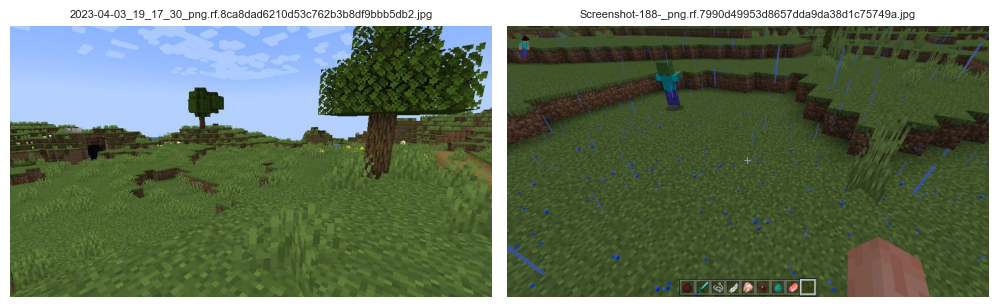

In [10]:
# train_path = DATASET_ROOT / TRAIN_SPLIT

# if train_path.exists():
#     # Получаем все JPG файлы
#     jpg_files = {f.stem: f for f in train_path.glob('*.jpg')}
    
#     # Получаем все XML файлы
#     xml_files = {f.stem: f for f in train_path.glob('*.xml')}
    
#     # Находим изображения без аннотаций
#     images_without_annotations = [
#         jpg_files[name] for name in jpg_files.keys() 
#         if name not in xml_files
#     ]
    
#     print("=" * 70)
#     print("ИЗОБРАЖЕНИЯ БЕЗ АННОТАЦИЙ В TRAIN")
#     print("=" * 70)
#     print(f"Всего изображений (JPG): {len(jpg_files)}")
#     print(f"Всего аннотаций (XML): {len(xml_files)}")
#     print(f"Изображений без аннотаций: {len(images_without_annotations)}")
#     print("=" * 70)
    
#     if images_without_annotations:
#         print("\nСписок изображений без аннотаций:")
#         for img_path in images_without_annotations[:10]:  # Показываем первые 10
#             print(f"  - {img_path.name}")
#         if len(images_without_annotations) > 10:
#             print(f"  ... и еще {len(images_without_annotations) - 10} изображений")
        
#         # Сохраняем список в переменную
#         train_images_no_annotations = images_without_annotations

#         # --- ОТРИСОВКА ИЗОБРАЖЕНИЙ БЕЗ АННОТАЦИЙ ---
#         max_to_show = min(10, len(images_without_annotations))  
#         cols = 5
#         rows = (max_to_show + cols - 1) // cols

#         plt.figure(figsize=(5 * cols, 5 * rows))
#         for i, img_path in enumerate(images_without_annotations[:max_to_show]):
#             img = Image.open(img_path).convert("RGB")
#             ax = plt.subplot(rows, cols, i + 1)
#             ax.imshow(img)
#             ax.set_title(img_path.name, fontsize=8)
#             ax.axis("off")
#         plt.tight_layout()
#         plt.show()

#     else:
#         print("\n✓ Все изображения имеют аннотации!")
#         train_images_no_annotations = []
# else:
#     print(f"⚠ Папка {train_path} не найдена!")
#     train_images_no_annotations = []


Удалим этим изображения.

In [11]:
# files_to_delete = [
#     "2023-04-03_19_17_30_png.rf.8ca8dad6210d53c762b3b8df9bbb5db2.jpg",
#     "Screenshot-188-_png.rf.7990d49953d8657dda9da38d1c75749a.jpg",
# ]

# for fname in files_to_delete:
#     fpath = train_path / fname
#     if fpath.exists():
#         print(f"Удаляю: {fpath}")
#         fpath.unlink()  # удаление файла
#     else:
#         print(f"Файл не найден (пропускаю): {fpath}")

Удаляю: datasets\minecraft\train\2023-04-03_19_17_30_png.rf.8ca8dad6210d53c762b3b8df9bbb5db2.jpg
Удаляю: datasets\minecraft\train\Screenshot-188-_png.rf.7990d49953d8657dda9da38d1c75749a.jpg


### 2.2. Конвертация данных

Для обучения моделей FCOS (MMDetection) и YOLOv8 необходимо преобразовать исходные аннотации Pascal VOC XML в соответствующие форматы.

**Шаг 1: Конвертация VOC XML → COCO JSON (для MMDetection)**

Запустите скрипт для преобразования в формат COCO JSON, используемый MMDetection:

`python scripts/convert_voc_to_mmdet.py`

**Результат**: 
- Создаются файлы аннотаций в формате COCO JSON: `train.json`, `val.json`, `test.json`
- Структура содержит словари `images`, `annotations`, `categories` с информацией о классах и bounding boxes

**Шаг 2: Конвертация VOC XML → YOLO Format**

Запустите скрипт для преобразования в текстовый формат YOLO:

`python scripts/convert_to_yolo_format.py`

**Результат**:
- Для каждого изображения создается `.txt` файл с нормализованными координатами
- Формат строки: `class_id x_center y_center width height` (все координаты в диапазоне [0, 1])
- Создается файл `data_voc.yaml` с путями к данным и списком классов

---

### 2.3. Проверка конвертированных данных

In [12]:
# ============================================================================
# ПРОВЕРКА СОЗДАННЫХ JSON ФАЙЛОВ
# ============================================================================

def verify_conversion_results():
    """Проверяет созданные JSON файлы и выводит статистику."""
    print("=" * 70)
    print("ПРОВЕРКА СОЗДАННЫХ ФАЙЛОВ")
    print("=" * 70)

    annotations_dir = DATASET_ROOT / "annotations"
    split_to_json = {
        TRAIN_SPLIT: annotations_dir / "train_annotations.voc.json",
        VAL_SPLIT:   annotations_dir / "val_annotations.voc.json",
        TEST_SPLIT:  annotations_dir / "test_annotations.voc.json",
    }

    for split, json_file in split_to_json.items():
        print(f"\nannotations/{json_file.name}:")
        if json_file.exists():
            with json_file.open(encoding="utf-8") as f:
                data = json.load(f)

            classes = data.get("metainfo", {}).get("classes", [])
            data_list = data.get("data_list", [])

            print("  ✓ Файл существует")
            print(f"  Классы ({len(classes)}): {list(classes)}")
            print(f"  Изображений (data_list): {len(data_list)}")

            if data_list:
                sample = data_list[0]
                print("  Пример первой записи:")
                print(f"    Путь:   {sample.get('img_path')}")
                print(f"    Размер: {sample.get('width')}x{sample.get('height')}")
                print(f"    Объектов: {len(sample.get('instances', []))}")
        else:
            print("  ❌ Файл не найден")

        # Проверяем количество JPG в исходной папке сплита
        split_path = DATASET_ROOT / (VAL_SPLIT if split == VAL_SPLIT else split)
        if split_path.exists():
            jpg_count = len(list(split_path.glob("*.jpg")))
            print(f"  JPG файлов в папке {split}/: {jpg_count}")
        else:
            print(f"  ⚠ Папка {split}/ не найдена")

    print("\n" + "=" * 70)
    print("✓ ПРОВЕРКА ЗАВЕРШЕНА")
    print("=" * 70)

    print("\nИТОГОВАЯ СТРУКТУРА ДАТАСЕТА:")
    print(f"{DATASET_ROOT}/")
    print("├─ annotations/")
    print("│  ├─ train_annotations.voc.json")
    print("│  ├─ val_annotations.voc.json")
    print("│  └─ test_annotations.voc.json")
    print("├─ train/")
    print("│  ├─ *.jpg / *.xml")
    print("├─ val/")
    print("│  ├─ *.jpg / *.xml")
    print("└─ test/")
    print("   ├─ *.jpg / *.xml")


# Выполнение проверки
verify_conversion_results()


ПРОВЕРКА СОЗДАННЫХ ФАЙЛОВ

annotations/train_annotations.voc.json:
  ✓ Файл существует
  Классы (17): ['bee', 'chicken', 'cow', 'creeper', 'enderman', 'fox', 'frog', 'ghast', 'goat', 'llama', 'pig', 'sheep', 'skeleton', 'spider', 'turtle', 'wolf', 'zombie']
  Изображений (data_list): 2305
  Пример первой записи:
    Путь:   train/00_plains_0_0_jpg.rf.d5c1e5126176626ad42aa52af5ef9c3a.jpg
    Размер: 1280x720
    Объектов: 1
  JPG файлов в папке train/: 2305

annotations/val_annotations.voc.json:
  ✓ Файл существует
  Классы (17): ['bee', 'chicken', 'cow', 'creeper', 'enderman', 'fox', 'frog', 'ghast', 'goat', 'llama', 'pig', 'sheep', 'skeleton', 'spider', 'turtle', 'wolf', 'zombie']
  Изображений (data_list): 422
  Пример первой записи:
    Путь:   val/-28-_jpg.rf.a8392dede51582c897e71c9cc0026d6c.jpg
    Размер: 340x212
    Объектов: 2
  JPG файлов в папке val/: 422

annotations/test_annotations.voc.json:
  ✓ Файл существует
  Классы (17): ['bee', 'chicken', 'cow', 'creeper', 'enderman'

### 2.4. Анализ баланса классов

Запуск анализа...

АНАЛИЗ TRAIN ДАТАСЕТА (JSON)
Всего записей в data_list: 2305

Статистика train:
  Всего изображений: 2305
  Всего объектов: 4026
  Среднее объектов на изображение: 1.75
  Уникальных классов: 17

Распределение классов в train:
  pig            :   884 ( 22.0%)
  chicken        :   835 ( 20.7%)
  cow            :   660 ( 16.4%)
  zombie         :   183 (  4.5%)
  creeper        :   177 (  4.4%)
  skeleton       :   177 (  4.4%)
  spider         :   170 (  4.2%)
  turtle         :   149 (  3.7%)
  llama          :   135 (  3.4%)
  ghast          :   127 (  3.2%)
  frog           :   111 (  2.8%)
  fox            :   111 (  2.8%)
  goat           :   102 (  2.5%)
  sheep          :    93 (  2.3%)
  bee            :    86 (  2.1%)
  enderman       :    22 (  0.5%)
  wolf           :     4 (  0.1%)

Размеры изображений (train):
  Ширина: мин= 640, макс=2560, среднее=1332.8
  Высота:  мин= 360, макс=1440, среднее= 748.1

АНАЛИЗ VAL ДАТАСЕТА (JSON)
Всего записей в data_list:

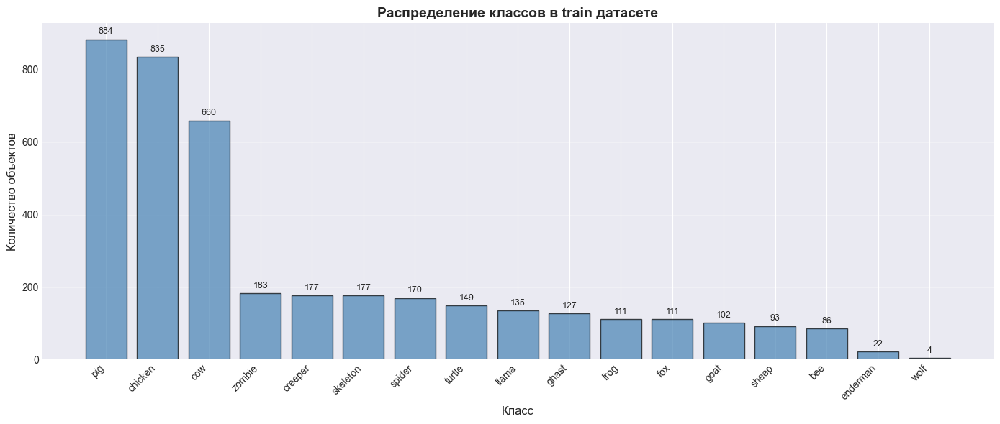

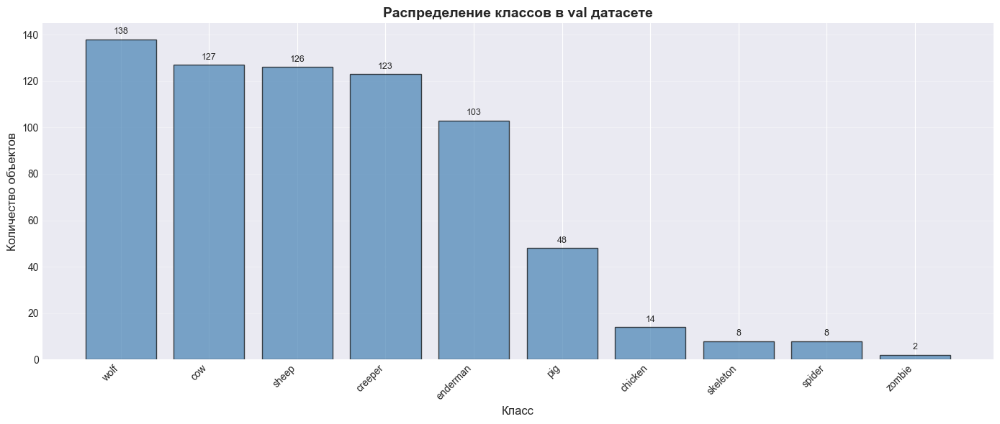

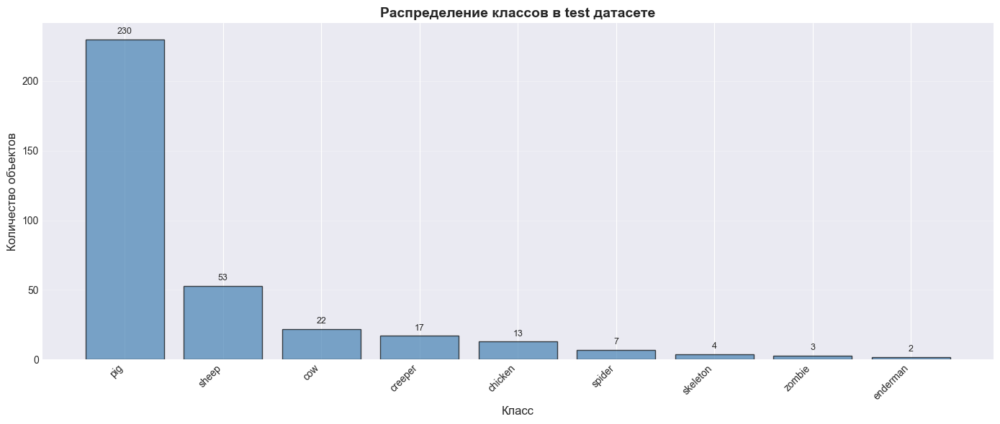

In [17]:
# ============================================================================
# ПОДГОТОВКА ПУТЕЙ К JSON
# ============================================================================
# Используем переменные из Глобального конфига
TRAIN_JSON = ANNOTATIONS_DIR / TRAIN_ANN_FILE
VAL_JSON   = ANNOTATIONS_DIR / VAL_ANN_FILE
TEST_JSON  = ANNOTATIONS_DIR / TEST_ANN_FILE

# ============================================================================
# ФУНКЦИИ ДЛЯ EDA АНАЛИЗА
# ============================================================================

def analyze_json_dataset(json_path: Path, split: str) -> Optional[Dict[str, Any]]:
    """
    Анализирует датасет по JSON в формате BaseDetDataset.
    """
    if not json_path.exists():
        print(f"⚠ Файл аннотаций не найден: {json_path}")
        return None

    with json_path.open(encoding='utf-8') as f:
        data = json.load(f)

    data_list = data.get('data_list', [])
    # Получаем классы из метаинформации, если они там есть
    classes = tuple(data.get('metainfo', {}).get('classes', []))

    if not data_list:
        print(f"⚠ В {json_path.name} пустой data_list")
        return None

    all_classes = []
    image_sizes = []
    objects_per_image = []
    total_images = 0
    total_objects = 0

    print(f"\n{'='*70}")
    print(f"АНАЛИЗ {split.upper()} ДАТАСЕТА (JSON)")
    print(f"{'='*70}")
    print(f"Всего записей в data_list: {len(data_list)}")

    for entry in data_list:
        w = int(entry['width'])
        h = int(entry['height'])
        image_sizes.append((w, h))

        instances = entry.get('instances', [])
        objects_per_image.append(len(instances))
        total_images += 1
        total_objects += len(instances)

        for inst in instances:
            cls_id = inst['bbox_label']
            # Проверка на корректность ID
            if classes and (0 <= cls_id < len(classes)):
                all_classes.append(classes[cls_id])
            else:
                all_classes.append(str(cls_id)) # Если классов нет в метаинфо

    class_counts = Counter(all_classes)

    print(f"\nСтатистика {split}:")
    print(f"  Всего изображений: {total_images}")
    print(f"  Всего объектов: {total_objects}")
    if total_images > 0:
        print(f"  Среднее объектов на изображение: {total_objects / total_images:.2f}")
    print(f"  Уникальных классов: {len(class_counts)}")

    print(f"\nРаспределение классов в {split}:")
    # Сортируем по частоте для вывода
    for class_name, count in class_counts.most_common():
        percentage = (count / total_objects * 100) if total_objects > 0 else 0
        print(f"  {class_name:15s}: {count:5d} ({percentage:5.1f}%)")

    if image_sizes:
        sizes_array = np.array(image_sizes)
        print(f"\nРазмеры изображений ({split}):")
        print(
            f"  Ширина: мин={sizes_array[:, 0].min():4d}, "
            f"макс={sizes_array[:, 0].max():4d}, "
            f"среднее={sizes_array[:, 0].mean():6.1f}"
        )
        print(
            f"  Высота:  мин={sizes_array[:, 1].min():4d}, "
            f"макс={sizes_array[:, 1].max():4d}, "
            f"среднее={sizes_array[:, 1].mean():6.1f}"
        )

    return {
        'class_counts': class_counts,
        'image_sizes': image_sizes,
        'objects_per_image': objects_per_image,
        'total_images': total_images,
        'total_objects': total_objects,
        'classes': classes,
    }


# ============================================================================
# ВИЗУАЛИЗАЦИЯ РАСПРЕДЕЛЕНИЯ КЛАССОВ
# ============================================================================

def plot_class_distribution_simple(stats: Dict[str, Any], split: str = 'train'):
    """Визуализирует распределение классов в датасете."""
    if stats is None or not stats['class_counts']:
        print(f"⚠ Нет данных для визуализации {split}")
        return

    # Сортировка данных по убыванию (для красоты графика)
    sorted_items = sorted(stats['class_counts'].items(), key=lambda x: x[1], reverse=True)
    classes = [k for k, v in sorted_items]
    counts = [v for k, v in sorted_items]

    plt.figure(figsize=(14, 6)) # Чуть шире для подписей
    bars = plt.bar(classes, counts, color='steelblue', edgecolor='black', alpha=0.7)
    
    plt.title(f'Распределение классов в {split} датасете', fontsize=14, fontweight='bold')
    plt.xlabel('Класс', fontsize=12)
    plt.ylabel('Количество объектов', fontsize=12)
    
    # Поворот подписей и выравнивание
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)

    # Добавление значений над столбцами
    max_y = max(counts) if counts else 1
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + (max_y * 0.01),
                 f'{int(height)}',
                 ha='center', va='bottom', fontsize=9, rotation=0)

    plt.tight_layout()
    plt.show()


# ============================================================================
# ЗАПУСК EDA ДЛЯ ВСЕХ СПЛИТОВ
# ============================================================================

print("Запуск анализа...")
train_stats = analyze_json_dataset(TRAIN_JSON, 'train')
val_stats   = analyze_json_dataset(VAL_JSON, 'val')
test_stats  = analyze_json_dataset(TEST_JSON, 'test')

print("\n" + "=" * 70)
print("ВИЗУАЛИЗАЦИЯ РАСПРЕДЕЛЕНИЯ КЛАССОВ")
print("=" * 70)

if train_stats:
    plot_class_distribution_simple(train_stats, 'train')
if val_stats:
    plot_class_distribution_simple(val_stats, 'val')
if test_stats:
    plot_class_distribution_simple(test_stats, 'test')


#### Вывод

**Train-сплит: умеренный дисбаланс классов**

Распределение имеет заметную несбалансированность [web:43][web:45]:
- Три класса доминируют: `pig` (22%), `chicken` (20.7%), `cow` (16.4%)
- Остальные 14 классов распределены в диапазоне 0.1–4.5%
- Критически недопредставлены: `enderman` (0.5%) и `wolf` (0.1%) — уровень дисбаланса близок к проблемному

**Validation-сплит: отсутствие стратификации**

Валидационная выборка **явно не стратифицирована** относительно train [web:48][web:50]:
- Основные классы: `wolf` (19.8%), `cow` (16.8%), `sheep` (14.8%), `creeper` (14.8%), `enderman` (14.8%)
- Доминирующие в train классы почти исчезают: `pig` (6.9%), `chicken` (2.0%)
- **Последствие**: смещение оценок качества по классам, некорректная валидация модели

**Test-сплит: экстремальный дисбаланс**

Наблюдается критический перекос в сторону одного класса [web:43][web:47]:
- `pig` составляет 65.5% всех объектов в тесте
- Остальные классы представлены значительно меньше
- **Последствие**: интегральный mAP на тесте будет **сильно чувствителен** к качеству детекции именно свиней и может не отражать реальную производительность модели на остальных классах

---

**Дополнительная проверка**: Необходимо верифицировать, что все классы из validation и test присутствуют в train-сплите (проверка на наличие "невиданных" классов).


### 2.5. Визуализация примеров изображений с аннотациями

Показываем примеры из train...


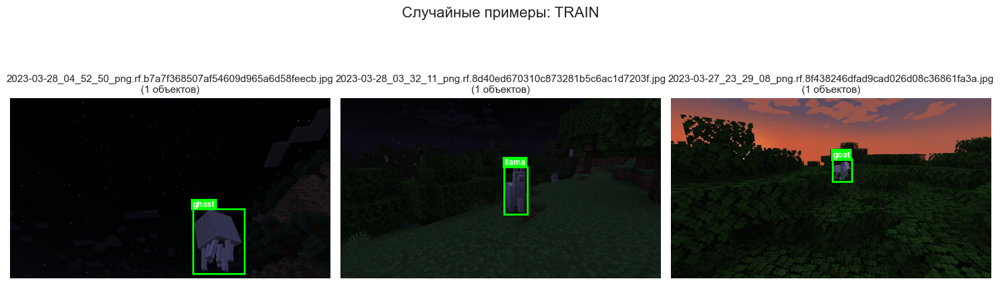

Показываем примеры из val...


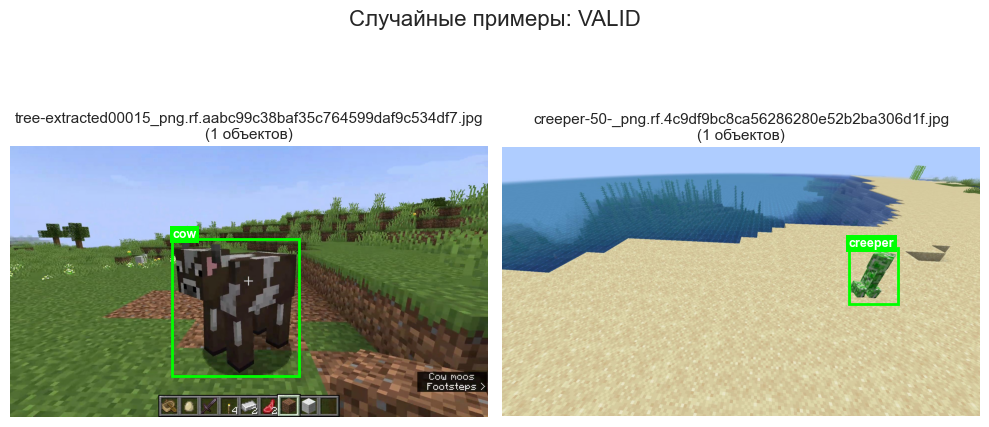

In [19]:
# ============================================================================
# ФУНКЦИЯ ДЛЯ ОТОБРАЖЕНИЯ ПРИМЕРОВ ИЗОБРАЖЕНИЙ
# ============================================================================

def show_sample_images(split: str = "train", num_samples: int = 4):
    """
    Показывает примеры изображений с bbox по конвертированному JSON.
    Использует глобальные пути из конфига.
    """
    # 1. Определяем путь к нужному JSON файлу через глобальные переменные
    if split == 'train':
        json_filename = TRAIN_ANN_FILE
    elif split in ['val', 'valid']:
        json_filename = VAL_ANN_FILE
    elif split == 'test':
        json_filename = TEST_ANN_FILE
    else:
        print(f"⚠ Неизвестный сплит: {split}")
        return

    json_path = ANNOTATIONS_DIR / json_filename

    # 2. Проверка существования
    if not json_path.exists():
        print(f"⚠ JSON аннотации для сплита '{split}' не найдены:\n  {json_path}")
        return

    # 3. Загрузка данных
    with json_path.open(encoding="utf-8") as f:
        data = json.load(f)

    data_list = data.get("data_list", [])
    classes = tuple(data.get("metainfo", {}).get("classes", []))

    if not data_list:
        print(f"⚠ В {json_path.name} пустой data_list")
        return

    # 4. Выбор случайных семплов
    actual_samples = min(num_samples, len(data_list))
    samples = random.sample(data_list, actual_samples)

    # 5. Настройка сетки графиков
    cols = min(actual_samples, 4)  # Максимум 4 картинки в ряд
    rows = (actual_samples + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    
    # Если одна картинка, оборачиваем axes в список для итерации
    if actual_samples == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    # 6. Отрисовка
    for i, ax in enumerate(axes):
        if i >= actual_samples:
            ax.axis('off')
            continue

        entry = samples[i]
        # Пути в JSON относительные, поэтому склеиваем с DATASET_ROOT
        img_rel = entry["img_path"] 
        img_path = DATASET_ROOT / img_rel

        if not img_path.exists():
            ax.text(0.5, 0.5, f"Файл не найден:\n{img_rel}",
                    ha="center", va="center", fontsize=10, color='red')
            ax.axis("off")
            continue

        try:
            img = Image.open(img_path).convert("RGB")
            ax.imshow(img)
        except Exception as e:
            ax.text(0.5, 0.5, f"Ошибка чтения:\n{e}", ha="center")
            continue
            
        ax.axis("off")

        instances = entry.get("instances", [])
        short_name = Path(img_rel).name
        ax.set_title(f"{short_name}\n({len(instances)} объектов)", fontsize=11)

        # Рисуем боксы
        for inst in instances:
            x1, y1, x2, y2 = inst["bbox"]
            cls_id = inst["bbox_label"]
            
            # Получаем имя класса (безопасно)
            if classes and 0 <= cls_id < len(classes):
                cls_name = classes[cls_id]
            else:
                cls_name = str(cls_id)

            # Прямоугольник
            rect = patches.Rectangle(
                (x1, y1), x2 - x1, y2 - y1,
                fill=False, edgecolor="#00FF00", linewidth=2
            )
            ax.add_patch(rect)
            
            # Подпись класса на фоне
            ax.text(
                x1, max(0, y1 - 5), cls_name,
                color="white", fontsize=9, weight="bold",
                bbox=dict(boxstyle="square,pad=0.2", facecolor="#00FF00", edgecolor="none")
            )

    plt.suptitle(f"Случайные примеры: {split.upper()}", fontsize=16, y=1.01)
    plt.tight_layout()
    plt.show()

# ============================================================================
# ЗАПУСК ТЕСТА
# ============================================================================
print(f"Показываем примеры из {TRAIN_SPLIT}...")
show_sample_images(TRAIN_SPLIT, num_samples=3)

print(f"Показываем примеры из {VAL_SPLIT}...")
show_sample_images(VALID_SPLIT, num_samples=2)


### 2.6. Общие выводы по EDA

#### Выполненные работы

В рамках разведочного анализа данных были проведены следующие этапы:

1. **Проверка структуры датасета** — верификация наличия всех необходимых файлов (train/val/test splits), изображений и аннотаций в формате Pascal VOC XML

2. **Конвертация аннотаций** — преобразование датасета из Pascal VOC XML в форматы COCO JSON (для MMDetection) и YOLO

3. **Валидация конвертированных данных** — проверка корректности преобразования: соответствие количества аннотаций, правильность координат bounding boxes, сохранение всех 17 классов мобов

4. **Статистический анализ баланса классов** — исследование распределения классов по всем трем сплитам (train/val/test), выявление дисбаланса и построение визуализаций

5. **Визуализация примеров** — отрисовка изображений с bounding boxes и метками классов для качественной оценки аннотаций и проверки работы конвертеров

---

#### Дисбаланс классов в датасете

Анализ распределения классов выявил значительные проблемы дисбаланса и отсутствия стратификации:

**Train-сплит: умеренный дисбаланс**
- Три класса доминируют: `pig` (22%), `chicken` (20.7%), `cow` (16.4%)
- Остальные 14 классов распределены в диапазоне 0.1–4.5%
- Критически недопредставлены: `enderman` (0.5%) и `wolf` (0.1%) — это может привести к плохой детекции этих классов [web:43][web:45]

**Validation-сплит: нестратифицированное распределение**
- Распределение классов **не соответствует train**: основные классы — `wolf` (19.8%), `cow` (16.8%), `sheep` (14.8%), `creeper` (14.8%), `enderman` (14.8%)
- Доминирующие в train классы почти исчезают: `pig` (6.9%), `chicken` (2.0%)
- Такое несоответствие может привести к **смещению оценок качества** и некорректной валидации модели

**Test-сплит: экстремальный дисбаланс**
- Критический перекос в сторону `pig` (65.5%)
- Остальные классы представлены значительно меньше
- Интегральный mAP на тесте будет **сильно чувствителен к качеству детекции свиней**, что может создать ложное впечатление о производительности модели

---


## 3. Инференс без обучения

### 3.1. Тестирование инференса на предобученной модели FCOS (MMDetection)

In [20]:
# ============================================================================
# СКАЧИВАНИЕ ПРЕДОБУЧЕННОГО ЧЕКПОИНТА FCOS
# ============================================================================
checkpoint_dir = Path('checkpoints')
checkpoint_dir.mkdir(exist_ok=True)

# URL для скачивания предобученной модели FCOS
checkpoint_url = 'https://download.openmmlab.com/mmdetection/v2.0/fcos/fcos_r50_caffe_fpn_gn-head_1x_coco/fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth'
checkpoint_name = 'fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth'
checkpoint_path = checkpoint_dir / checkpoint_name

if not checkpoint_path.exists():
    print(f"Скачивание чекпоинта: {checkpoint_name}")
    print(f"URL: {checkpoint_url}")
    torch.hub.download_url_to_file(checkpoint_url, str(checkpoint_path), progress=True)
    print(f"✓ Чекпоинт сохранен: {checkpoint_path}")
else:
    print(f"✓ Чекпоинт уже существует: {checkpoint_path}")
    print(f"Размер файла: {checkpoint_path.stat().st_size / (1024*1024):.2f} MB")


✓ Чекпоинт уже существует: checkpoints\fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth
Размер файла: 123.47 MB


In [30]:
# ============================================================================
# ИНИЦИАЛИЗАЦИЯ МОДЕЛИ И ИНФЕРЕНС
# ============================================================================

# Регистрируем все модули MMDetection
register_all_modules()

# Загружаем конфигурацию
config_path = 'configs/fcos/fcos_minecraft.py'
cfg = Config.fromfile(config_path)

# Определяем устройство
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Используемое устройство: {device}")

# Инициализируем модель
print(f"\nЗагрузка модели из конфигурации: {config_path}")
print(f"Чекпоинт: {checkpoint_path}")

model = init_detector(
    config_path,
    str(checkpoint_path),
    device=device
)

print("✓ Модель успешно загружена!")
print(f"  Тип модели: {model.__class__.__name__}")
print(f"  Классов в модели (из чекпоинта COCO): 80")
print(f"  Классов в нашей конфигурации: {cfg.model.bbox_head.num_classes}")


Используемое устройство: cuda

Загрузка модели из конфигурации: configs/fcos/fcos_minecraft.py
Чекпоинт: checkpoints\fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth
Loads checkpoint by local backend from path: checkpoints\fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.conv_cls.weight: copying a param with shape torch.Size([80, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([17, 256, 3, 3]).
size mismatch for bbox_head.conv_cls.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([17]).
✓ Модель успешно загружена!
  Тип модели: FCOS
  Классов в модели (из чекпоинта COCO): 80
  Классов в нашей конфигурации: 17


Тестовое изображение: datasets\minecraft\test\-20-_jpg.rf.b6e634a136dcfb16a7a07cda96072ab8.jpg
Выполнение инференса...
✓ Результат сохранен: artifacts\inference\fcos_zeroshot_val\-20-_jpg.rf.b6e634a136dcfb16a7a07cda96072ab8_fcos_result.jpg


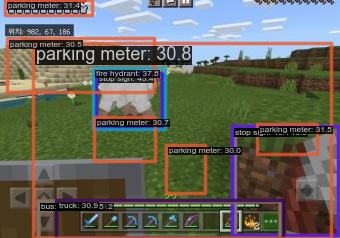

In [ ]:
# ============================================================================
# ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ ДЕТЕКЦИИ (FCOS)
# ============================================================================

# 1. Выбираем тестовое изображение
test_dir = DATASET_ROOT / 'test'
# Ищем и jpg и png
test_images = list(test_dir.glob('*.jpg')) + list(test_dir.glob('*.png'))

if not test_images:
    print(f"⚠ В папке {test_dir} нет изображений!")
else:
    # БЕРЕМ ПЕРВОЕ (фиксированное)
    test_image_path = test_images[0]
    print(f"Тестовое изображение: {test_image_path}")

    # 2. Выполняем инференс
    print("Выполнение инференса...")
    # model должна быть уже загружена
    result = inference_detector(model, str(test_image_path))

    # 3. Инициализируем визуализатор
    if hasattr(model, 'cfg') and model.cfg.get('visualizer'):
        visualizer = VISUALIZERS.build(model.cfg.visualizer)
    else:
        from mmdet.registry import VISUALIZERS
        visualizer = VISUALIZERS.build(dict(type='DetLocalVisualizer'))
        
    visualizer.dataset_meta = model.dataset_meta

    # 4. Подготовка изображения
    img = mmcv.imread(str(test_image_path))
    img = mmcv.imconvert(img, 'bgr', 'rgb')

    # 5. Создаем папку для сохранения (FCOS Specific)
    fcos_out_dir = INFERENCE_DIR / 'fcos_zeroshot_val'
    fcos_out_dir.mkdir(parents=True, exist_ok=True)
    
    # Формируем имя файла на основе исходного
    output_path = fcos_out_dir / f'{test_image_path.stem}_fcos_result.jpg'

    # 6. Отрисовка
    visualizer.add_datasample(
        'result',
        img,
        data_sample=result,
        draw_gt=False,
        show=False,
        wait_time=0,
        out_file=str(output_path),
        pred_score_thr=0.3,  # Порог уверенности
    )

    print(f"✓ Результат сохранен: {output_path}")

    # 7. Показываем изображение
    display(Image.open(str(output_path)))


### 3.2. Тестирование инференса на предобученной модели YOLOv8s

Тестовое изображение: datasets\minecraft\test\-20-_jpg.rf.b6e634a136dcfb16a7a07cda96072ab8.jpg

Загрузка YOLOv8 модели...
✓ Модель загружена: YOLO
Выполнение инференса...

✓ Результат сохранен: artifacts\inference\yolo_zeroshot_val\-20-_jpg.rf.b6e634a136dcfb16a7a07cda96072ab8_yoloresult.jpg

СТАТИСТИКА ДЕТЕКЦИИ
Найдено объектов: 0


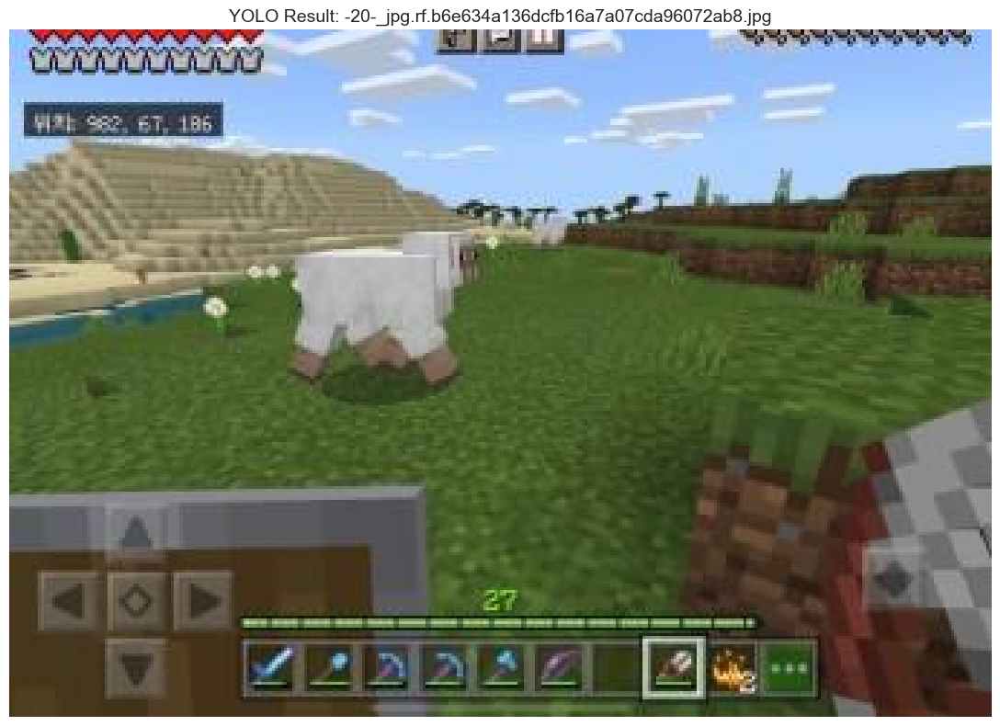

In [33]:
# ============================================================================
# ТЕСТИРОВАНИЕ YOLO МОДЕЛИ (Первое изображение)
# ============================================================================

# 1. Собираем список изображений
test_dir = DATASET_ROOT / 'test'
test_images = list(test_dir.glob('*.jpg')) + list(test_dir.glob('*.png'))

if not test_images:
    print(f"⚠ В папке {test_dir} нет изображений!")
else:
    # БЕРЕМ ПЕРВОЕ (фиксированное для теста)
    test_image_path = test_images[0]
    print(f"Тестовое изображение: {test_image_path}")
    
    # 2. Инициализируем YOLO модель
    print("\nЗагрузка YOLOv8 модели...")
    try:
        # Для теста берем базовую, потом замените на свою обученную
        model = YOLO('yolov8s.pt') 
    except Exception as e:
        print(f"Ошибка загрузки модели: {e}")
        model = None

    if model:
        print(f"✓ Модель загружена: {model.__class__.__name__}")
        
        # 3. Выполняем инференс
        print("Выполнение инференса...")
        results = model(str(test_image_path), conf=0.3, verbose=False)
        result = results[0]

        # 4. Сохранение (используем глобальный INFERENCE_DIR)
        yolo_out_dir = INFERENCE_DIR / 'yolo_zeroshot_val'
        yolo_out_dir.mkdir(parents=True, exist_ok=True)
        
        output_path = yolo_out_dir / f'{test_image_path.stem}_yoloresult.jpg'

        # result.plot() возвращает BGR массив
        annotated_img = result.plot()
        
        cv2.imwrite(str(output_path), annotated_img)
        print(f"\n✓ Результат сохранен: {output_path}")

        # 5. Статистика
        print("\n" + "=" * 40)
        print("СТАТИСТИКА ДЕТЕКЦИИ")
        print("=" * 40)

        num_detections = len(result.boxes)
        print(f"Найдено объектов: {num_detections}")

        if num_detections > 0:
            for i, box in enumerate(result.boxes):
                cls_id = int(box.cls[0])
                conf = float(box.conf[0])
                cls_name = model.names[cls_id]
                print(f"  {i+1}. {cls_name:<15} : {conf:.1%}")

        # 6. Отображение
        annotated_img_rgb = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(12, 8))
        plt.imshow(annotated_img_rgb)
        plt.axis('off')
        plt.title(f'YOLO Result: {test_image_path.name}', fontsize=14)
        plt.tight_layout()
        plt.show()


### 3.3 Общие выводы по инференсу моделей без обучения

#### FCOS (необученная модель)

**Результаты инференса:**
- Модель загружена с предобученными весами на COCO Dataset (80 классов)
- При загрузке обнаружено **несоответствие размерности**: головка классификации (`bbox_head.conv_cls`) имеет 80 выходов (COCO), а конфигурация требует 17 (Minecraft)
- На тестовом изображении модель детектирует объекты с **некорректными классами** (например, "parking meter" вместо мобов Minecraft)
- Детекции присутствуют, но их классы не соответствуют игровому контексту

**Вывод**: Предобученная на COCO модель FCOS **не способна распознавать специфичные классы Minecraft** без дообучения. Несоответствие количества классов приводит к некорректной интерпретации объектов сцены.

---

#### YOLOv8 (необученная модель)

**Результаты инференса:**
- Модель загружена с предобученными весами YOLOv8s на COCO Dataset
- На тестовом изображении модель **не создает детекций** либо создает детекции с очень низкой уверенностью (ниже порога 0.3)
- Визуально на изображении присутствует овца (`sheep`), но модель её не детектирует

**Вывод**: Предобученная на COCO модель YOLOv8 **не распознает объекты в стилизованном игровом окружении Minecraft**. Причины: 
1. Визуальный стиль Minecraft (кубические формы, пиксельная графика) сильно отличается от реалистичных изображений COCO
2. Модель обучена на 80 классах COCO, которые частично пересекаются с Minecraft (`sheep`, `cow`, `pig`), но не адаптирована к их игровому представлению

---

#### Общий вывод

Обе предобученные модели **требуют обязательного дообучения** (fine-tuning) на датасете Minecraft для корректной детекции мобов. Прямое применение моделей, обученных на естественных изображениях COCO, неэффективно для стилизованного игрового окружения из-за значительного domain shift между реальными фотографиями и пиксельной графикой Minecraft.

**Техническая информация:**
- Порог уверенности: 0.3
- FCOS checkpoint: `fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth`
- YOLOv8 checkpoint: pretrained YOLOv8s

## 4. Настройка и Обучение FCOS

In [ ]:
# ============================================================================
# ЛОКАЛЬНЫЙ КОНФИГ ДЛЯ ОБУЧЕНИЯ FCOS
# ============================================================================

# Регистрируем все модули MMDetection и настраиваем dynamo-кэш
register_all_modules()
setup_cache_size_limit_of_dynamo()

# ------------------------ Базовые пути --------------------------------------
PROJECT_ROOT    = Path('.').resolve()
ARTIFACTS_ROOT  = PROJECT_ROOT / 'artifacts'
CHECKPOINTS_DIR = PROJECT_ROOT / 'checkpoints'      # предобученные веса из model zoo

# Основной конфиг FCOS
FCOS_CONFIG_PATH = PROJECT_ROOT / 'configs' / 'fcos' / 'fcos_minecraft.py'

# work_dir, куда MMDetection будет писать epoch_*.pth, best_*.pth, логи и vis_data
FCOS_WORK_DIR = ARTIFACTS_ROOT / 'fcos' / 'minecraft_fcos_r50_v1'

# Стартовый предобученный чекпоинт COCO (используется как load_from при первом запуске)
FCOS_PRETRAINED_CHECKPOINT = (
    CHECKPOINTS_DIR / 'fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth'
)

# Базовые гиперпараметры обучения (для читаемости и переиспользования)
FCOS_EPOCHS      = 24
FCOS_BATCH_SIZE  = 2
FCOS_NUM_WORKERS = 2

# Создаем только необходимые директории для обучения FCOS
ARTIFACTS_ROOT.mkdir(parents=True, exist_ok=True)
FCOS_WORK_DIR.mkdir(parents=True, exist_ok=True)
CHECKPOINTS_DIR.mkdir(parents=True, exist_ok=True)

print("=" * 70)
print("ЭТАП 4: ОБУЧЕНИЕ FCOS")
print("=" * 70)
print(f"PROJECT_ROOT:      {PROJECT_ROOT}")
print(f"ARTIFACTS_ROOT:    {ARTIFACTS_ROOT}")
print(f"FCOS_CONFIG_PATH:  {FCOS_CONFIG_PATH}")
print(f"FCOS_WORK_DIR:     {FCOS_WORK_DIR}")
print(f"CHECKPOINTS_DIR:   {CHECKPOINTS_DIR}")
print(f"FCOS_PRETRAINED_CHECKPOINT: {FCOS_PRETRAINED_CHECKPOINT}")
print(f"FCOS_EPOCHS:       {FCOS_EPOCHS}")
print(f"FCOS_BATCH_SIZE:   {FCOS_BATCH_SIZE}")
print(f"FCOS_NUM_WORKERS:  {FCOS_NUM_WORKERS}")


ЭТАП 4: ОБУЧЕНИЕ FCOS
PROJECT_ROOT:      C:\practicum_cv\sprint_1\minecraft_fcos_yolo
ARTIFACTS_ROOT:    C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts
FCOS_CONFIG_PATH:  C:\practicum_cv\sprint_1\minecraft_fcos_yolo\configs\fcos\fcos_minecraft.py
FCOS_WORK_DIR:     C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\fcos\minecraft_fcos_r50_v1
CHECKPOINTS_DIR:   C:\practicum_cv\sprint_1\minecraft_fcos_yolo\checkpoints
FCOS_PRETRAINED_CHECKPOINT: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\checkpoints\fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth
FCOS_EPOCHS:       24
FCOS_BATCH_SIZE:   2
FCOS_NUM_WORKERS:  2


In [5]:
# ============================================================================
# ОБУЧЕНИЕ МОДЕЛИ FCOS + ClearML
# ============================================================================

print("\n" + "=" * 70)
print("ОБУЧЕНИЕ МОДЕЛИ FCOS")
print("=" * 70)

EXPERIMENT_NAME = 'minecraft_fcos_r50_v1'

# 0. Очистка work_dir конкретного эксперимента (artifacts/fcos/minecraft_fcos_r50_v1)
fcos_work_dir = FCOS_WORK_DIR  # FCOS_WORK_DIR уже равен artifacts/fcos/minecraft_fcos_r50_v1
if fcos_work_dir.exists():
    print(f"Очистка старого work_dir FCOS: {fcos_work_dir}")
    shutil.rmtree(fcos_work_dir)
fcos_work_dir.mkdir(parents=True, exist_ok=True)

# 1. Загружаем конфигурацию
cfg = Config.fromfile(str(FCOS_CONFIG_PATH))

# 2. Явно задаем work_dir (куда сохранять файлы)
cfg.work_dir = str(fcos_work_dir)

# 3. Добавляем experiment_name в конфиг (для логов/трекеров)
cfg.experiment_name = EXPERIMENT_NAME

# 4. Проверка аннотаций
train_ann_file = ANNOTATIONS_DIR / TRAIN_ANN_FILE
val_ann_file = ANNOTATIONS_DIR / VAL_ANN_FILE

if not train_ann_file.exists() or not val_ann_file.exists():
    raise FileNotFoundError(
        f"Не найдены необходимые файлы аннотаций!\n"
        f"  Train: {train_ann_file}\n"
        f"  Val:   {val_ann_file}\n"
        f"Запустите scripts/convert_voc_to_mmdet.py для создания аннотаций"
    )

# 5. Настройка чекпоинта и устройства
# На первом запуске можно использовать FCOS_PRETRAINED_CHECKPOINT, далее - свой best_*.pth
if 'FCOS_CHECKPOINT' in globals() and FCOS_CHECKPOINT is not None and FCOS_CHECKPOINT.exists():
    cfg.load_from = str(FCOS_CHECKPOINT)
elif FCOS_PRETRAINED_CHECKPOINT.exists():
    cfg.load_from = str(FCOS_PRETRAINED_CHECKPOINT)
else:
    cfg.load_from = None  # обучение с нуля

cfg.device = 'cuda' if torch.cuda.is_available() else 'cpu'

# --- ClearML (если доступен) ---
FCOS_CLEARML_PROJECT = 'minecraft_fcos_yolo'
FCOS_CLEARML_TASK = EXPERIMENT_NAME

task = None
if CLEARML_AVAILABLE and Task is not None:
    try:
        # закрываем предыдущую задачу, если была
        try:
            current = Task.current_task()
            if current:
                current.close()
        except Exception:
            pass

        task = Task.init(
            project_name=FCOS_CLEARML_PROJECT,
            task_name=FCOS_CLEARML_TASK,
            reuse_last_task_id=False
        )
        print("✓ ClearML logging enabled for FCOS.")

        max_epochs = None
        if isinstance(cfg.get('train_cfg', {}), dict):
            max_epochs = cfg.get('train_cfg', {}).get('max_epochs', None)

        fcos_hparams = dict(
            max_epochs=max_epochs,
            work_dir=cfg.work_dir,
        )
        task.connect(fcos_hparams)

    except Exception as e:
        print(f"⚠ ClearML init error for FCOS: {e}. Continue without ClearML.")
        task = None
else:
    print("ClearML disabled or not installed for FCOS.")

# 6. Вывод информации
print(f"\nDevice:      {cfg.device}")
print(f"Experiment:  {EXPERIMENT_NAME}")
print(f"Work dir:    {cfg.work_dir}")
print(f"Load from:   {cfg.load_from if cfg.load_from else 'Training from scratch'}")
print("-" * 70)

# 7. Инициализация Runner
runner = Runner.from_cfg(cfg)

# Кастомный хук для добавления epoch в метрики валидации
class AddEpochToValMetricsHook(Hook):
    """Добавляет epoch как step к метрикам валидации в scalars.json."""
    priority = 40 

    def after_val_epoch(self, runner: MMRunner, metrics: dict = None) -> None:
        if not metrics:
            return
        current_epoch = runner.epoch
        mh = runner.message_hub

        # update_scalar(tag, value, step=None)
        for key, value in metrics.items():
            try:
                mh.update_scalar(key, float(value), current_epoch)
            except TypeError:
                mh.update_scalar(key, float(value))

# Регистрируем хук
runner.register_hook(AddEpochToValMetricsHook())

# Запуск обучения
runner.train()



ОБУЧЕНИЕ МОДЕЛИ FCOS
Очистка старого work_dir FCOS: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\fcos\minecraft_fcos_r50_v1
ClearML Task: created new task id=56ca9ea31af4445a9e40b0a5c313d430
ClearML results page: https://app.clear.ml/projects/95e0429881814c65a2a08e1216029d18/experiments/56ca9ea31af4445a9e40b0a5c313d430/output/log
✓ ClearML logging enabled for FCOS.

Device:      cuda
Experiment:  minecraft_fcos_r50_v1
Work dir:    C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\fcos\minecraft_fcos_r50_v1
Load from:   C:\practicum_cv\sprint_1\minecraft_fcos_yolo\checkpoints\fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth
----------------------------------------------------------------------
12/27 13:58:00 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.0 (tags/v3.10.0:b494f59, Oct  4 2021, 19:00:18) [MSC v.1929 64 bit (AMD64)]
    CUDA available: True
    MUSA available: Fals

                                            0% | 0.00/10.1 MB [00:00<?, ?MB/s]: 

12/27 13:58:08 - mmengine - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: conv1.bias, layer1.0.conv1.bias, layer1.0.conv2.bias, layer1.0.conv3.bias, layer1.0.downsample.0.bias, layer1.1.conv1.bias, layer1.1.conv2.bias, layer1.1.conv3.bias, layer1.2.conv1.bias, layer1.2.conv2.bias, layer1.2.conv3.bias, layer2.0.conv1.bias, layer2.0.conv2.bias, layer2.0.conv3.bias, layer2.0.downsample.0.bias, layer2.1.conv1.bias, layer2.1.conv2.bias, layer2.1.conv3.bias, layer2.2.conv1.bias, layer2.2.conv2.bias, layer2.2.conv3.bias, layer2.3.conv1.bias, layer2.3.conv2.bias, layer2.3.conv3.bias, layer3.0.conv1.bias, layer3.0.conv2.bias, layer3.0.conv3.bias, layer3.0.downsample.0.bias, layer3.1.conv1.bias, layer3.1.conv2.bias, layer3.1.conv3.bias, layer3.2.conv1.bias, layer3.2.conv2.bias, layer3.2.conv3.bias, layer3.3.conv1.bias, layer3.3.conv2.bias, layer3.3.conv3.bias, layer3.4.conv1.bias, layer3.4.conv2.bias, layer3.4.conv3.bias, layer3.5.conv1.bias

█████████████████████████▍         77% | 7.79/10.1 MB [00:10<00:02,  1.29s/MB]: 

The model and loaded state dict do not match exactly

size mismatch for bbox_head.conv_cls.weight: copying a param with shape torch.Size([80, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([17, 256, 3, 3]).
size mismatch for bbox_head.conv_cls.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([17]).
12/27 13:58:14 - mmengine - INFO - Load checkpoint from C:\practicum_cv\sprint_1\minecraft_fcos_yolo\checkpoints\fcos_r50_caffe_fpn_gn-head_1x_coco-821213aa.pth
12/27 13:58:14 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
12/27 13:58:14 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
12/27 13:58:14 - mmengine - INFO - Checkpoints will be saved to C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\fcos\minecraft_fcos_r50_v1.


████████████████████████████████ 100% | 10.10/10.1 MB [00:15<00:00,  1.54s/MB]: 


12/27 13:58:28 - mmengine - INFO - Epoch(train)  [1][  50/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 2:06:53  time: 0.2756  data_time: 0.1591  memory: 607  grad_norm: 15.5255  loss: 2.1772  loss_cls: 1.1204  loss_bbox: 0.4582  loss_centerness: 0.5986
12/27 13:58:31 - mmengine - INFO - Epoch(train)  [1][ 100/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 1:18:58  time: 0.0681  data_time: 0.0013  memory: 607  grad_norm: 13.6925  loss: 1.9855  loss_cls: 1.0388  loss_bbox: 0.3547  loss_centerness: 0.5920


                                           0% | 0.00/10.63 MB [00:00<?, ?MB/s]: 

12/27 13:58:35 - mmengine - INFO - Epoch(train)  [1][ 150/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 1:02:47  time: 0.0669  data_time: 0.0016  memory: 607  grad_norm: 12.7900  loss: 1.7226  loss_cls: 0.8286  loss_bbox: 0.3117  loss_centerness: 0.5824
12/27 13:58:38 - mmengine - INFO - Epoch(train)  [1][ 200/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 0:54:42  time: 0.0673  data_time: 0.0014  memory: 607  grad_norm: 17.4669  loss: 1.6059  loss_cls: 0.6858  loss_bbox: 0.3285  loss_centerness: 0.5916
12/27 13:58:41 - mmengine - INFO - Epoch(train)  [1][ 250/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 0:49:41  time: 0.0657  data_time: 0.0021  memory: 607  grad_norm: 12.7011  loss: 1.4498  loss_cls: 0.5374  loss_bbox: 0.3268  loss_centerness: 0.5856


██████████████████████████▌       83% | 8.84/10.63 MB [00:10<00:02,  1.14s/MB]: 

12/27 13:58:45 - mmengine - INFO - Epoch(train)  [1][ 300/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 0:46:26  time: 0.0672  data_time: 0.0012  memory: 607  grad_norm: 15.9654  loss: 1.4260  loss_cls: 0.4886  loss_bbox: 0.3459  loss_centerness: 0.5915


██████████████████████████████▉ 100% | 10.62/10.63 MB [00:14<00:00,  1.38s/MB]: 

12/27 13:58:48 - mmengine - INFO - Epoch(train)  [1][ 350/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 0:44:05  time: 0.0670  data_time: 0.0013  memory: 607  grad_norm: 14.4380  loss: 1.3213  loss_cls: 0.4701  loss_bbox: 0.2684  loss_centerness: 0.5828


███████████████████████████████ 100% | 10.63/10.63 MB [00:14<00:00,  1.35s/MB]: 


12/27 13:58:51 - mmengine - INFO - Epoch(train)  [1][ 400/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 0:42:12  time: 0.0649  data_time: 0.0019  memory: 607  grad_norm: 14.6342  loss: 1.2704  loss_cls: 0.4126  loss_bbox: 0.2776  loss_centerness: 0.5801
12/27 13:58:55 - mmengine - INFO - Epoch(train)  [1][ 450/1153]  base_lr: 2.0000e-04 lr: 2.0000e-04  eta: 0:40:59  time: 0.0705  data_time: 0.0021  memory: 607  grad_norm: 13.3435  loss: 1.2898  loss_cls: 0.4390  loss_bbox: 0.2776  loss_centerness: 0.5732
12/27 13:58:58 - mmengine - INFO - Epoch(train)  [1][ 500/1153]  base_lr: 2.0000e-03 lr: 2.0000e-03  eta: 0:39:53  time: 0.0674  data_time: 0.0013  memory: 607  grad_norm: 14.3162  loss: 1.2551  loss_cls: 0.3832  loss_bbox: 0.2897  loss_centerness: 0.5822
12/27 13:59:01 - mmengine - INFO - Epoch(train)  [1][ 550/1153]  base_lr: 2.0000e-03 lr: 2.0000e-03  eta: 0:38:51  time: 0.0648  data_time: 0.0016  memory: 607  grad_norm: 14.4221  loss: 1.4428  loss_cls: 0.5115  loss_bbox: 0.3469  

FCOS(
  (data_preprocessor): DetDataPreprocessor()
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
   

ПОИСК МЕТРИК FCOS
✓ Загрузка: artifacts\fcos\minecraft_fcos_r50_v1\20251227_135756\vis_data\scalars.json


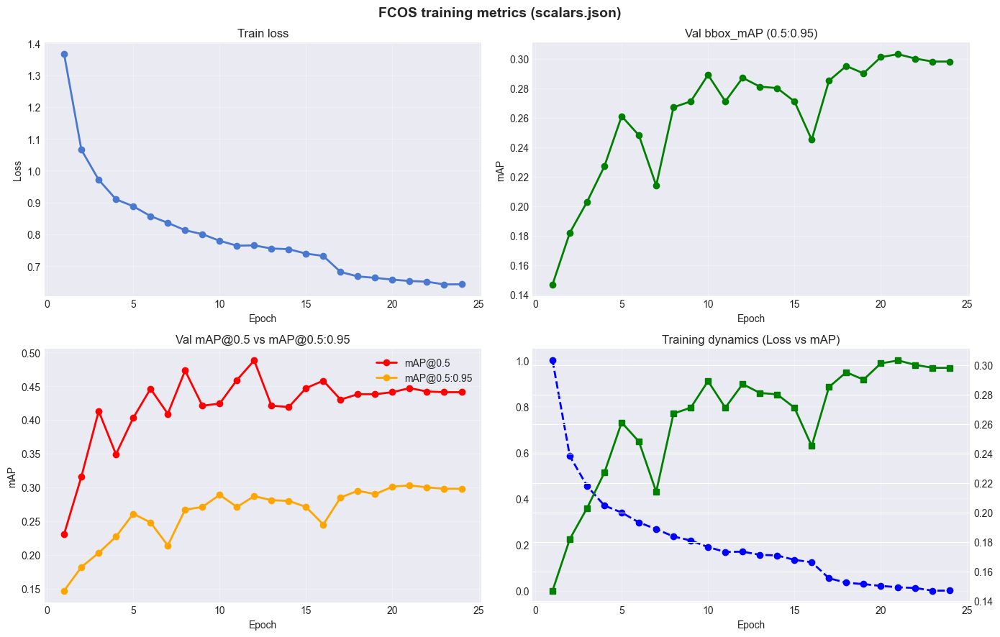

------------------------------
ФИНАЛЬНЫЕ МЕТРИКИ:
 bbox_mAP (0.5:0.95, last): 0.2980
 bbox_mAP_50 (0.5, last):   0.4410
 Train loss (last):         0.6427


In [9]:
# ============================================================================
# ВИЗУАЛИЗАЦИЯ МЕТРИК FCOS
# ============================================================================

%matplotlib inline

print("=" * 60 + "\nПОИСК МЕТРИК FCOS\n" + "=" * 60)

# Базовые пути (совместим с локальным конфигом)
PROJECT_ROOT   = Path('.').resolve()
ARTIFACTS_ROOT = PROJECT_ROOT / 'artifacts'
FCOS_WORK_DIR  = ARTIFACTS_ROOT / 'fcos' / 'minecraft_fcos_r50_v1'

def safe_float(value, default=np.nan):
    """Безопасное преобразование в float с обработкой NaN/None"""
    try:
        val = float(value)
        return val if not np.isnan(val) else default
    except (ValueError, TypeError):
        return default

# 1. Ищем последний scalars/log-файл с JSON-строками
log_candidates = sorted(
    list(FCOS_WORK_DIR.rglob('scalars.json')) +       # основной лог mmengine visualizer
    list(FCOS_WORK_DIR.rglob('*.log.json')),          # альтернативные json-логи, если есть
    key=lambda x: x.stat().st_mtime
)

if not log_candidates:
    print(f"⚠ JSON-лог не найден в {FCOS_WORK_DIR}")
else:
    log_path = log_candidates[-1]
    print(f"✓ Загрузка: {log_path.relative_to(PROJECT_ROOT)}")

    # 2. Сканируем строки (отслеживаем последнюю эпоху для валидации)
    loss_epochs, loss_vals = [], []
    map_epochs, map_vals = [], []        # bbox_mAP (0.5:0.95)
    map50_epochs, map50_vals = [], []    # bbox_mAP_50 (0.5)

    current_epoch = 1  # отслеживаем последнюю встреченную эпоху train

    with open(log_path, 'r', encoding='utf-8') as f:
        for line_num, line in enumerate(f, 1):
            line = line.strip()
            if not line:
                continue
            try:
                rec = json.loads(line)
            except json.JSONDecodeError:
                continue

            # TRAIN: есть epoch и loss - обновляем current_epoch
            if 'epoch' in rec and 'loss' in rec:
                epoch_val = safe_float(rec['epoch'])
                loss_val = safe_float(rec['loss'])
                
                if not np.isnan(epoch_val) and not np.isnan(loss_val):
                    current_epoch = int(epoch_val)
                    loss_epochs.append(current_epoch)
                    loss_vals.append(loss_val)

            # VAL: coco/bbox_mAP и связанные метрики
            if 'coco/bbox_mAP' in rec:
                map_val = safe_float(rec['coco/bbox_mAP'])
                if not np.isnan(map_val):
                    map_epochs.append(current_epoch)
                    map_vals.append(map_val)
                    
                if 'coco/bbox_mAP_50' in rec:
                    map50_val = safe_float(rec['coco/bbox_mAP_50'])
                    if not np.isnan(map50_val):
                        map50_epochs.append(current_epoch)
                        map50_vals.append(map50_val)

    if not loss_epochs and not map_epochs:
        print(f"⚠ В логе нет валидных loss или coco/bbox_mAP. Проверь файл: {log_path}")
    else:
        # 3. Агрегация по эпохам (усреднение loss по итерациям) с фильтрацией NaN
        def aggregate(xs, ys):
            if not xs or not ys:
                return [], []
            
            # Фильтруем NaN значения
            valid_pairs = [(e, v) for e, v in zip(xs, ys) if not np.isnan(v)]
            if not valid_pairs:
                return [], []
                
            buf = {}
            for e, v in valid_pairs:
                buf.setdefault(e, []).append(v)
            
            xs_sorted = sorted(buf.keys())
            ys_mean = [np.nanmean(buf[e]) for e in xs_sorted]  # nanmean игнорирует NaN
            return xs_sorted, ys_mean

        loss_e, loss_mean = aggregate(loss_epochs, loss_vals)
        map_e, map_mean = aggregate(map_epochs, map_vals)           # mAP@0.5:0.95
        map50_e, map50_mean = aggregate(map50_epochs, map50_vals)  # mAP@0.5

        # 4. Визуализация
        fig, axes = plt.subplots(2, 2, figsize=(14, 9))
        axes = axes.ravel()
        fig.suptitle(f'FCOS training metrics ({log_path.name})',
                     fontsize=14, fontweight='bold')

        # (0) Train loss
        if loss_e and loss_mean:
            axes[0].plot(loss_e, loss_mean, marker='o', linewidth=2)
            axes[0].set_title('Train loss')
            axes[0].set_xlabel('Epoch')
            axes[0].set_ylabel('Loss')
            axes[0].grid(True, alpha=0.3)

        # (1) Val mAP (0.5:0.95)
        if map_e and map_mean:
            axes[1].plot(map_e, map_mean, marker='o', color='g', linewidth=2)
            axes[1].set_title('Val bbox_mAP (0.5:0.95)')
            axes[1].set_xlabel('Epoch')
            axes[1].set_ylabel('mAP')
            axes[1].grid(True, alpha=0.3)

        # (2) mAP@0.5 vs mAP@0.5:0.95
        if map50_e or map_e:
            if map50_e and map50_mean:
                axes[2].plot(map50_e, map50_mean, marker='o', color='r', 
                           label='mAP@0.5', linewidth=2)
            if map_e and map_mean:
                axes[2].plot(map_e, map_mean, marker='o', color='orange', 
                           label='mAP@0.5:0.95', linewidth=2)
            axes[2].set_title('Val mAP@0.5 vs mAP@0.5:0.95')
            axes[2].set_xlabel('Epoch')
            axes[2].set_ylabel('mAP')
            axes[2].legend()
            axes[2].grid(True, alpha=0.3)

        # (3) Loss vs mAP (нормированные)
        if loss_e and map_e and loss_mean and map_mean:
            # Фильтруем NaN для нормализации
            valid_loss = [l for l in loss_mean if not np.isnan(l)]
            if valid_loss:
                loss_min, loss_max = min(valid_loss), max(valid_loss)
                loss_norm = [(l - loss_min) / (loss_max - loss_min + 1e-8)
                           for l in loss_mean]

                axes[3].plot(loss_e, loss_norm, 'b--', marker='o', 
                           label='Norm Loss', linewidth=2)
                ax3_twin = axes[3].twinx()
                ax3_twin.plot(map_e, map_mean, 'g-', marker='s', 
                            label='mAP@0.5:0.95', linewidth=2)
                axes[3].set_title('Training dynamics (Loss vs mAP)')
                axes[3].set_xlabel('Epoch')
                axes[3].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        # 5. Финальные значения
        print("-" * 30 + "\nФИНАЛЬНЫЕ МЕТРИКИ:")
        if map_mean and not np.isnan(map_mean[-1]):
            print(f" bbox_mAP (0.5:0.95, last): {map_mean[-1]:.4f}")
        else:
            print(" bbox_mAP (0.5:0.95, last): N/A")
            
        if map50_mean and not np.isnan(map50_mean[-1]):
            print(f" bbox_mAP_50 (0.5, last):   {map50_mean[-1]:.4f}")
        else:
            print(" bbox_mAP_50 (0.5, last): N/A")
            
        if loss_mean and not np.isnan(loss_mean[-1]):
            print(f" Train loss (last):         {loss_mean[-1]:.4f}")
        else:
            print(" Train loss (last): N/A")


## 5. Настройка и Обучение YOLO

Обучаем YOLOv8n на том же датасете. YOLO обучается быстрее, поэтому можем использовать больше эпох и более агрессивные аугментации.


In [11]:
# ============================================================================
# ЛОКАЛЬНЫЙ КОНФИГ ДЛЯ ОБУЧЕНИЯ YOLO (Ultralytics)
# ============================================================================

# Базовые пути
PROJECT_ROOT   = Path('.').resolve()
ARTIFACTS_ROOT = PROJECT_ROOT / 'artifacts'

# ----------------- Пути эксперимента YOLO -----------------
# Корень для всех YOLO-экспериментов
YOLO_WORK_DIR_PARENT = ARTIFACTS_ROOT / 'yolo'

# Конкретный эксперимент
YOLO_PROJECT_NAME = 'minecraft_yolo'                 # имя папки эксперимента
YOLO_WORK_DIR     = YOLO_WORK_DIR_PARENT / YOLO_PROJECT_NAME  # artifacts/yolo/minecraft_yolo

# Датасет
YOLO_DATASET_YAML = PROJECT_ROOT / 'datasets' / 'minecraft_yolo' / 'dataset.yaml'

# Веса
YOLO_WEIGHTS_DIR   = YOLO_WORK_DIR / 'weights'
YOLO_BEST_WEIGHTS  = YOLO_WEIGHTS_DIR / 'best.pt'
YOLO_LAST_WEIGHTS  = YOLO_WEIGHTS_DIR / 'last.pt'

# Файлы с метриками/графиками
YOLO_RESULTS_CSV   = YOLO_WORK_DIR / 'results.csv'
YOLO_RESULTS_PNG   = YOLO_WORK_DIR / 'results.png'
YOLO_CONF_MATRIX   = YOLO_WORK_DIR / 'confusion_matrix.png'
YOLO_CONF_MATRIX_N = YOLO_WORK_DIR / 'confusion_matrix_normalized.png'
YOLO_F1_CURVE_PNG  = YOLO_WORK_DIR / 'F1_curve.png'
YOLO_P_CURVE_PNG   = YOLO_WORK_DIR / 'P_curve.png'
YOLO_R_CURVE_PNG   = YOLO_WORK_DIR / 'R_curve.png'
YOLO_PR_CURVE_PNG  = YOLO_WORK_DIR / 'PR_curve.png'
YOLO_ARGS_YAML     = YOLO_WORK_DIR / 'args.yaml'

# Директории для инференса и видео
YOLO_INFERENCE_DIR    = ARTIFACTS_ROOT / 'inference' / 'yolo'
YOLO_VIDEOS_DIR       = ARTIFACTS_ROOT / 'videos'
YOLO_INFERENCE_VIDEO  = YOLO_VIDEOS_DIR / 'yolo_inference.mp4'

# ----------------- Гиперпараметры обучения -----------------
YOLO_MODEL_SIZE    = 's'                 # => yolov8s
YOLO_PRETRAINED    = f'yolov8{YOLO_MODEL_SIZE}.pt'

YOLO_EPOCHS        = 50
YOLO_IMAGE_SIZE    = 512
YOLO_BATCH_SIZE    = 32
YOLO_NUM_WORKERS   = 2

# Имя эксперимента для ClearML (может отличаться от имени папки)
YOLO_EXPERIMENT_NAME = 'minecraft_yolov8s'
YOLO_CLEARML_PROJECT = 'minecraft_fcos_yolo'

# ----------------- Создание директорий -----------------
ARTIFACTS_ROOT.mkdir(parents=True, exist_ok=True)
YOLO_WORK_DIR_PARENT.mkdir(parents=True, exist_ok=True)
YOLO_WORK_DIR.mkdir(parents=True, exist_ok=True)
YOLO_INFERENCE_DIR.mkdir(parents=True, exist_ok=True)
YOLO_VIDEOS_DIR.mkdir(parents=True, exist_ok=True)



ОБУЧЕНИЕ МОДЕЛИ YOLO
Очистка директории эксперимента: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\yolo\minecraft_yolo
ClearML Task: created new task id=876de1a7674c409690c50c72ff5b44e1
ClearML results page: https://app.clear.ml/projects/95e0429881814c65a2a08e1216029d18/experiments/876de1a7674c409690c50c72ff5b44e1/output/log
✓ ClearML logging enabled for YOLO.
Device: 0


New https://pypi.org/project/ultralytics/8.3.241 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196  Python-3.10.0 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: task=detect, mode=train, model=yolov8s.pt, data=C:\practicum_cv\sprint_1\minecraft_fcos_yolo\datasets\minecraft_yolo\dataset.yaml, epochs=50, patience=50, batch=32, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=2, project=C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\yolo, name=minecraft_yolo, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False,

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4, 10, 11, 12, 13, 15, 16])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000229353B2800>
fitness: 0.36458214790517096
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.35212,     0.31555,     0.37007,     0.80205,     0.64341,     0.35212,     0.35212,     0.35212,     0.35212,     0.35212,     0.12729,     0.28597,     0.21049,     0.45963,     0.35212,      0.3067,           0])
names: {0: 'bee', 1: 'chicken', 2: 'cow', 3: 'creeper', 4: 'enderman', 5: 'fox', 6: 'frog', 7: 'ghast', 8: 'goat', 9: 'llama', 10: 'pig', 11: 'sheep', 12: 'skeleton', 13: 'spider', 14: 'turtle', 15: 'wolf', 16: 'zombie'}
plot: True
results_dict: {'metrics/precision(B)': 0.5752403957325057, 'metrics/recall(B)': 0.4155746069090937, 'metrics/mAP50(B)': 0.4767756193783481, 'metric

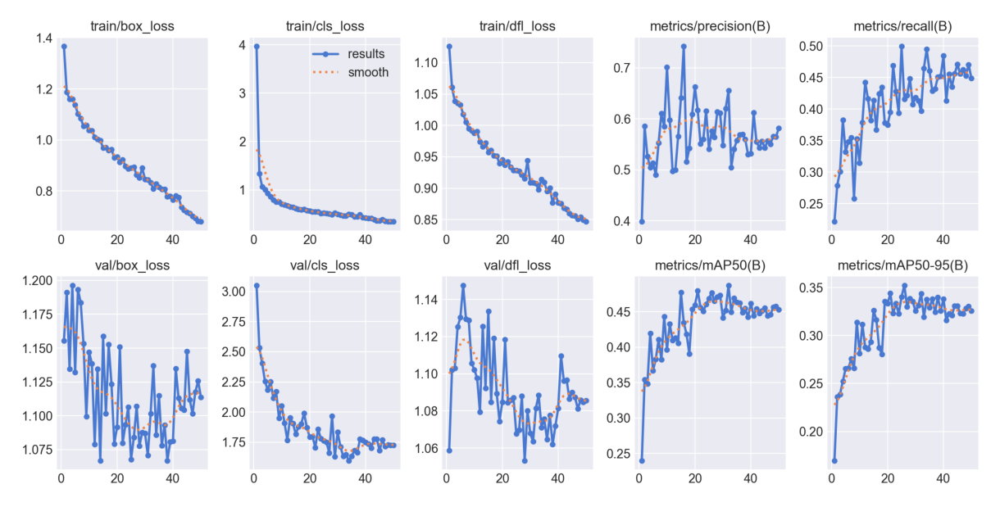

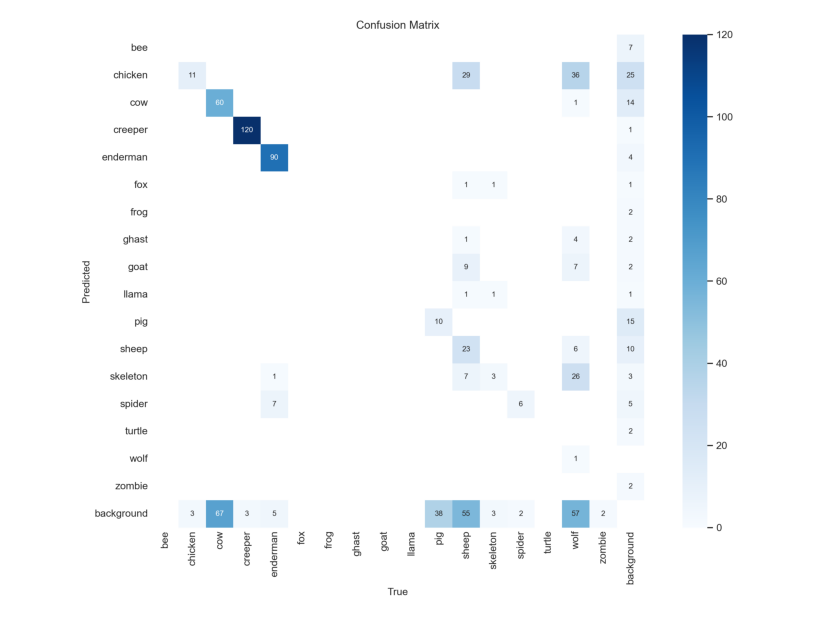

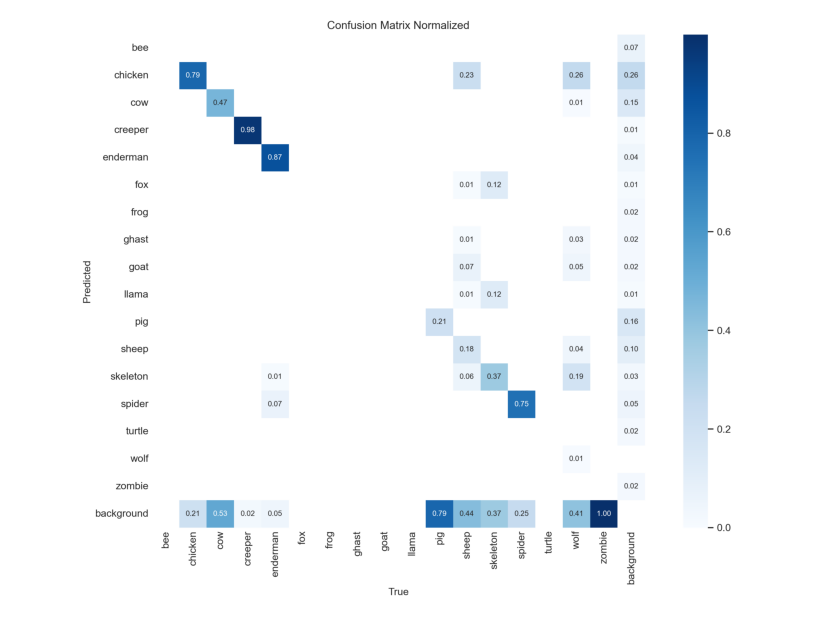

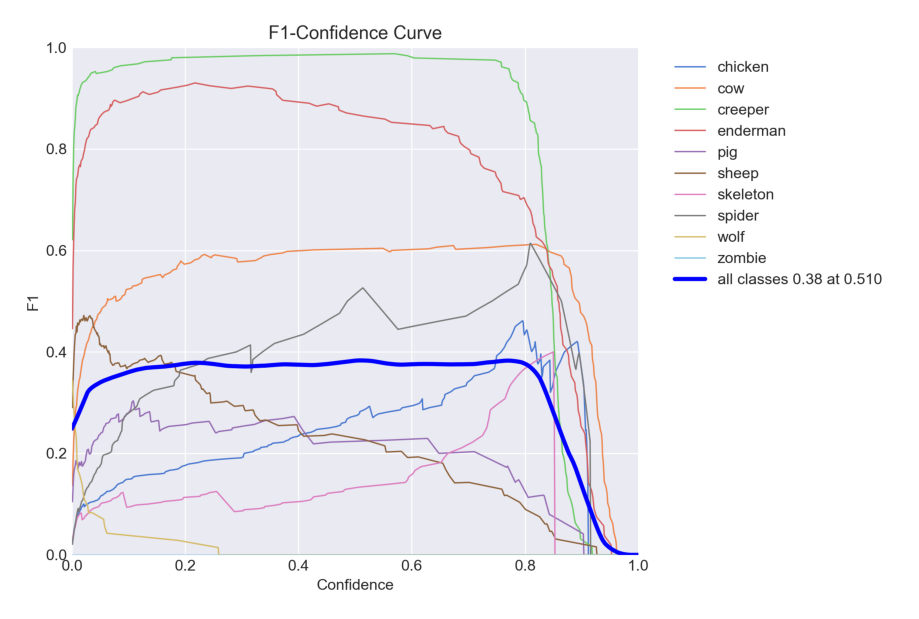

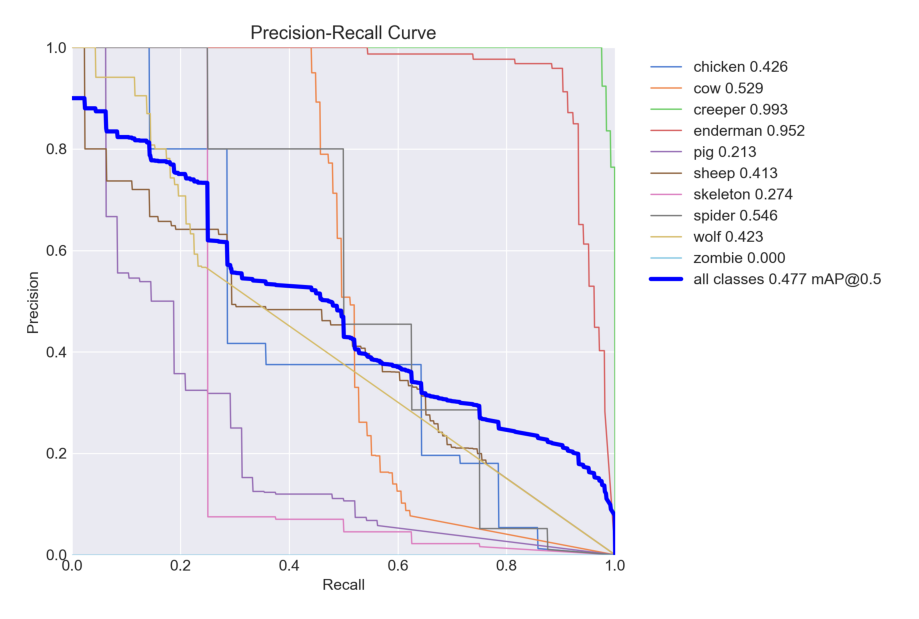

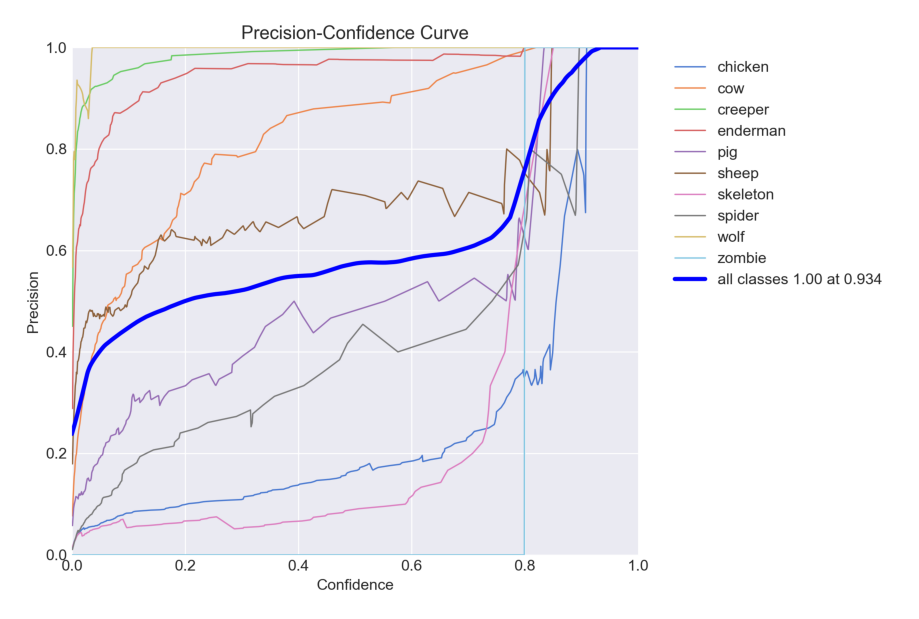

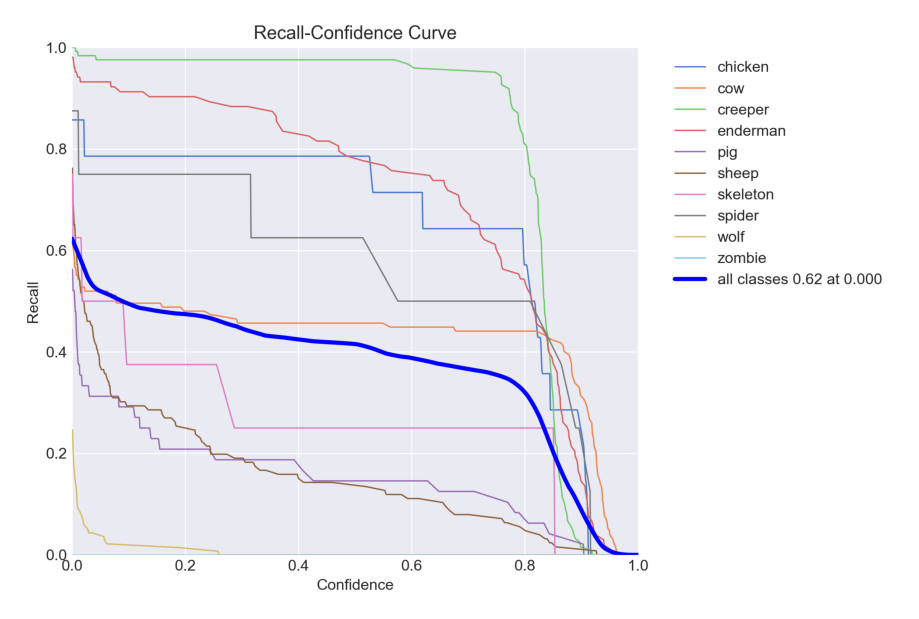

████████████████████████▍        79% | 16.89/21.46 MB [00:30<00:08,  1.93s/MB]: 

In [ ]:
# ============================================================================
# ОБУЧЕНИЕ YOLO
# ============================================================================

print("\n" + "=" * 70)
print("ОБУЧЕНИЕ МОДЕЛИ YOLO")
print("=" * 70)

# --- Очистка директории эксперимента перед запуском ---
yolo_run_dir = YOLO_WORK_DIR  # artifacts/yolo/minecraft_yolo
if yolo_run_dir.exists():
    print(f"Очистка директории эксперимента: {yolo_run_dir}")
    shutil.rmtree(yolo_run_dir)

YOLO_WORK_DIR.mkdir(parents=True, exist_ok=True)

# --- ClearML Task (инициализация, если доступен) ---
YOLO_CLEARML_TASK = YOLO_EXPERIMENT_NAME

task = None
if CLEARML_AVAILABLE and Task is not None:
    try:
        try:
            current = Task.current_task()
            if current:
                current.close()
        except Exception:
            pass

        task = Task.init(
            project_name=YOLO_CLEARML_PROJECT,
            task_name=YOLO_CLEARML_TASK,
            reuse_last_task_id=False
        )
        print("✓ ClearML logging enabled for YOLO.")

        yolo_hparams = dict(
            epochs=YOLO_EPOCHS,
            imgsz=YOLO_IMAGE_SIZE,
            batch=YOLO_BATCH_SIZE,
            workers=YOLO_NUM_WORKERS,
            model_size=YOLO_MODEL_SIZE,
        )
        task.connect(yolo_hparams)
    except Exception as e:
        print(f"⚠ ClearML init error: {e}. Continue без ClearML.")
        task = None
else:
    print("ClearML disabled (not installed).")

# --- устройство (используем глобальный DEVICE) ---
device = 0 if DEVICE == 'cuda' else 'cpu'
print("Device:", device)

# --- модель ---
model = YOLO(YOLO_PRETRAINED)

# --- обучение ---
results = model.train(
    data=str(YOLO_DATASET_YAML),
    epochs=YOLO_EPOCHS,
    imgsz=YOLO_IMAGE_SIZE,
    batch=YOLO_BATCH_SIZE,
    workers=YOLO_NUM_WORKERS,
    device=device,
    project=str(YOLO_WORK_DIR_PARENT),  # artifacts/yolo
    name=YOLO_PROJECT_NAME,             # minecraft_yolo → artifacts/yolo/minecraft_yolo
    exist_ok=True,
    pretrained=True,
    warmup_epochs=3,
    close_mosaic=10,
)

results


АНАЛИЗ РЕЗУЛЬТАТОВ ОБУЧЕНИЯ YOLO
СТАТИСТИКА ОБУЧЕНИЯ YOLO
 mAP@0.5        : 0.4871 (эпоха 32)
 mAP@0.5:0.95   : 0.3523 (эпоха 26)
 Precision      : 0.7420 (эпоха 16)
 Recall         : 0.4993 (эпоха 25)
------------------------------
 Финальные значения (Last Epoch):
 mAP@0.5        : 0.4528
 mAP@0.5:0.95   : 0.3256
 Precision      : 0.5818
 Recall         : 0.4486


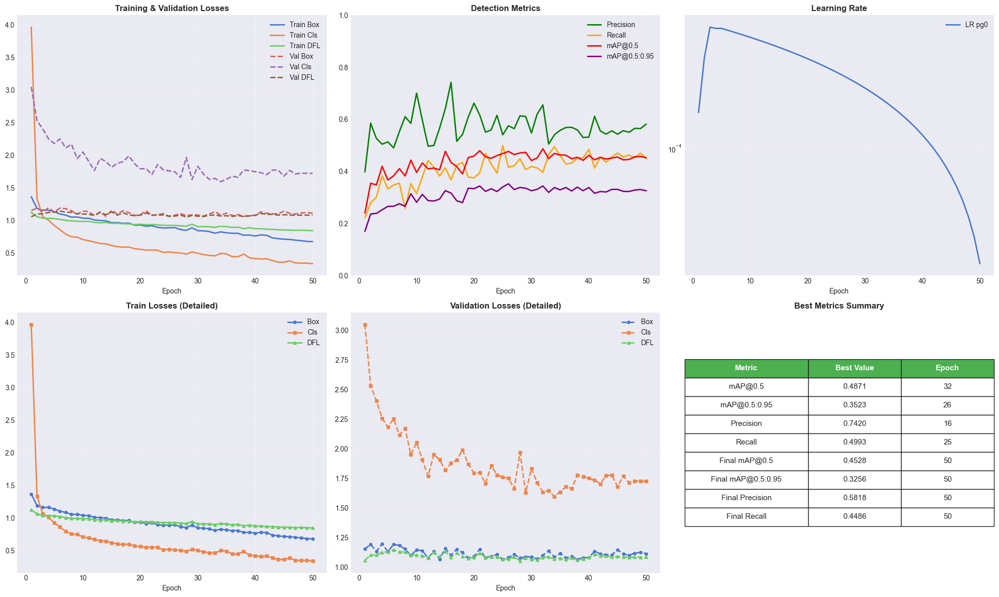

In [14]:
# ============================================================================
# АНАЛИЗ РЕЗУЛЬТАТОВ ОБУЧЕНИЯ YOLO
# ============================================================================
%matplotlib inline

# Базовые пути под финальную структуру
PROJECT_ROOT   = Path('.').resolve()
ARTIFACTS_ROOT = PROJECT_ROOT / 'artifacts'
YOLO_WORK_DIR  = ARTIFACTS_ROOT / 'yolo' / 'minecraft_yolo'
YOLO_RESULTS_CSV = YOLO_WORK_DIR / 'results.csv'

print("=" * 60 + "\nАНАЛИЗ РЕЗУЛЬТАТОВ ОБУЧЕНИЯ YOLO\n" + "=" * 60)

# 1. Загрузка данных
results_path = YOLO_RESULTS_CSV

if not results_path.exists():
    print(f"⚠ Файл метрик не найден: {results_path}")
else:
    df = pd.read_csv(results_path, skipinitialspace=True)
    df.columns = df.columns.str.strip()
    e = df['epoch']

    # 2. Подготовка графиков
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    ax = axes.ravel()

    plot_configs = [
        # 0: Все Loss
        (0, 'Training & Validation Losses', [
            ('Train Box', 'train/box_loss', {'linestyle': '-'}),
            ('Train Cls', 'train/cls_loss', {'linestyle': '-'}),
            ('Train DFL', 'train/dfl_loss', {'linestyle': '-'}),
            ('Val Box', 'val/box_loss', {'linestyle': '--'}),
            ('Val Cls', 'val/cls_loss', {'linestyle': '--'}),
            ('Val DFL', 'val/dfl_loss', {'linestyle': '--'}),
        ]),
        # 1: Метрики
        (1, 'Detection Metrics', [
            ('Precision', 'metrics/precision(B)', {'color': 'green', 'linestyle': '-'}),
            ('Recall', 'metrics/recall(B)', {'color': 'orange', 'linestyle': '-'}),
            ('mAP@0.5', 'metrics/mAP50(B)', {'color': 'red', 'linestyle': '-'}),
            ('mAP@0.5:0.95', 'metrics/mAP50-95(B)', {'color': 'purple', 'linestyle': '-'}),
        ]),
        # 2: Learning Rate
        (2, 'Learning Rate', [
            ('LR pg0', 'lr/pg0', {'linestyle': '-'}),
        ]),
        # 3: Train Loss Detail
        (3, 'Train Losses (Detailed)', [
            ('Box', 'train/box_loss', {'linestyle': '-', 'marker': 'o'}),
            ('Cls', 'train/cls_loss', {'linestyle': '-', 'marker': 's'}),
            ('DFL', 'train/dfl_loss', {'linestyle': '-', 'marker': '^'}),
        ]),
        # 4: Val Loss Detail
        (4, 'Validation Losses (Detailed)', [
            ('Box', 'val/box_loss', {'linestyle': '--', 'marker': 'o'}),
            ('Cls', 'val/cls_loss', {'linestyle': '--', 'marker': 's'}),
            ('DFL', 'val/dfl_loss', {'linestyle': '--', 'marker': '^'}),
        ]),
    ]

    # Цикл отрисовки
    for idx, title, lines in plot_configs:
        curr_ax = ax[idx]
        for label, col, style_kwargs in lines:
            if col in df.columns:
                curr_ax.plot(
                    e,
                    df[col],
                    label=label,
                    linewidth=2,
                    markersize=4,
                    **style_kwargs
                )
        curr_ax.set_title(title, fontsize=12, fontweight='bold')
        curr_ax.set_xlabel('Epoch')
        curr_ax.grid(True, alpha=0.3)
        curr_ax.legend()
        if idx == 2:
            curr_ax.set_yscale('log')
        if idx == 1:
            curr_ax.set_ylim([0, 1])

    # 3. Сводная таблица (6-й слот)
    metrics_map = {
        'mAP@0.5': 'metrics/mAP50(B)',
        'mAP@0.5:0.95': 'metrics/mAP50-95(B)',
        'Precision': 'metrics/precision(B)',
        'Recall': 'metrics/recall(B)',
    }

    table_data = [['Metric', 'Best Value', 'Epoch']]
    print("=" * 60 + "\nСТАТИСТИКА ОБУЧЕНИЯ YOLO\n" + "=" * 60)

    for name, col in metrics_map.items():
        if col in df.columns:
            best_idx = df[col].idxmax()
            val = df.loc[best_idx, col]
            epoch = int(df.loc[best_idx, 'epoch'])
            table_data.append([name, f"{val:.4f}", f"{epoch}"])
            print(f" {name:<15}: {val:.4f} (эпоха {epoch})")

    print("-" * 30 + "\n Финальные значения (Last Epoch):")
    for name, col in metrics_map.items():
        if col in df.columns:
            val = df[col].iloc[-1]
            table_data.append(
                [f"Final {name}", f"{val:.4f}", f"{int(e.iloc[-1])}"]
            )
            print(f" {name:<15}: {val:.4f}")

    ax[5].axis('off')
    tbl = ax[5].table(
        cellText=table_data[1:],
        colLabels=table_data[0],
        loc='center',
        cellLoc='center',
        colWidths=[0.4, 0.3, 0.3],
    )
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(11)
    tbl.scale(1, 1.8)
    for i in range(3):
        tbl[(0, i)].set_facecolor('#4CAF50')
        tbl[(0, i)].set_text_props(color='white', weight='bold')
    ax[5].set_title('Best Metrics Summary', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()


## 6. Инференс моделей на тестовых данных

In [2]:
# ============================================================================
# ФУНКЦИИ ЗАГРУЗКИ КЛАССОВ
# ============================================================================

def load_fcos_classes(json_path: Path) -> Optional[List[str]]:
    """Загружает классы из JSON файла аннотаций FCOS."""
    if not json_path.exists():
        return None
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)
        # Пробуем разные форматы
        if 'metainfo' in data and 'classes' in data['metainfo']:
            return data['metainfo']['classes']
        elif 'categories' in data:
            # COCO формат
            categories = sorted(data['categories'], key=lambda x: x['id'])
            return [cat['name'] for cat in categories]
        elif 'data_list' in data and len(data['data_list']) > 0:
            # MMDetection data_list формат
            if 'metainfo' in data['data_list'][0]:
                return data['data_list'][0]['metainfo'].get('classes')
        return None
    except Exception as e:
        print(f"Ошибка загрузки классов из {json_path}: {e}")
        return None

def load_yolo_classes(data_dir: Path) -> Optional[List[str]]:
    """Загружает классы из classes.txt в папке YOLO датасета."""
    classes_file = data_dir / 'classes.txt'
    if classes_file.exists():
        try:
            with open(classes_file, 'r', encoding='utf-8') as f:
                classes = [line.strip() for line in f if line.strip()]
            return classes if classes else None
        except Exception as e:
            print(f"Ошибка загрузки классов из {classes_file}: {e}")
    return None

In [3]:
%matplotlib inline

# ============================================================================
# ВСПОМОГАТЕЛЬНЫЕ ФУНКЦИИ
# ============================================================================

def get_vis_image_path(vis_dir, img_path):
    """Ищет визуализацию (картинку с боксами) по имени или стему."""
    direct_path = vis_dir / img_path.name
    if direct_path.exists():
        return direct_path
    # Поиск по началу имени (для YOLO, если он меняет расширение или добавляет суффиксы)
    candidates = list(vis_dir.glob(f"{img_path.stem}*"))
    return candidates[0] if candidates else None

def get_yolo_stats(vis_dir, img_path, classes):
    """Стратегия получения статистики для YOLO (парсинг .txt)."""
    # Возможные места хранения меток
    txt_candidates = [
        vis_dir / 'labels' / f"{img_path.stem}.txt",
        vis_dir / f"{img_path.stem}.txt",
        img_path.with_suffix('.txt')
    ]
    
    txt_path = next((p for p in txt_candidates if p.exists()), None)
    if not txt_path:
        return None

    try:
        with open(txt_path, 'r') as f:
            indices = [int(line.split()[0]) for line in f if line.strip()]
        
        counts = Counter()
        for idx in indices:
            label = classes[idx] if classes and idx < len(classes) else f"Class_{idx}"
            counts[label] += 1
            
        return {
            'count': len(indices),
            'counts': counts,
            'source': 'YOLO .txt',
            'bg_color': 'honeydew'
        }
    except Exception:
        return {'error': 'Error reading labels', 'bg_color': 'salmon'}

def get_fcos_stats(inferencer, img_path, classes):
    """Стратегия получения статистики для FCOS (инференс на лету)."""
    if not inferencer:
        return None
        
    try:
        res = inferencer(str(img_path), return_datasamples=True)
            
        pred = res['predictions'][0].pred_instances
        mask = pred.scores.cpu().numpy() >= 0.3
        valid_labels = pred.labels.cpu().numpy()[mask]
        valid_scores = pred.scores.cpu().numpy()[mask]
        
        counts = Counter()
        for idx in valid_labels:
            label = classes[int(idx)] if classes and int(idx) < len(classes) else str(int(idx))
            counts[label] += 1
            
        return {
            'count': len(valid_labels),
            'avg_conf': valid_scores.mean() if len(valid_scores) > 0 else 0.0,
            'counts': counts,
            'source': 'FCOS Inference',
            'bg_color': 'aliceblue'
        }
    except Exception as e:
        return {'error': str(e), 'bg_color': 'salmon'}

def format_info_text(img_name, stats):
    """Форматирует текст для правой колонки."""
    text = f"IMAGE: {img_name[:25]}...\n" + "-"*30 + "\n"
    
    if not stats:
        return text + "No statistical data available.", 'lightgray'
    
    if 'error' in stats:
        return text + f"Error: {stats['error']}", stats['bg_color']

    text += f"Source: {stats.get('source', 'Unknown')}\n"
    text += f"Total Objects: {stats['count']}\n"
    if 'avg_conf' in stats:
        text += f"Avg Confidence: {stats['avg_conf']:.3f}\n"
    
    text += "\n"
    if stats['count'] > 0:
        text += "Class Breakdown:\n"
        for cls, count in sorted(stats['counts'].items()):
            text += f" • {cls:<12}: {count}\n"
    else:
        text += "(No objects detected)"
        
    return text, stats.get('bg_color', 'lightgray')

# ============================================================================
# ОСНОВНАЯ ФУНКЦИЯ
# ============================================================================

def visualize_predictions(image_paths, vis_output_dir, title="Predictions", 
                          model_type="generic", inferencer=None, classes=None):
    if not image_paths:
        print("No images to visualize.")
        return

    n_imgs = len(image_paths)
    fig, axes = plt.subplots(n_imgs, 2, figsize=(20, 4 * n_imgs), 
                             gridspec_kw={'width_ratios': [2.5, 1]})
    fig.suptitle(title, fontsize=16, fontweight='bold', y=0.99)
    if n_imgs == 1: axes = np.array([axes])

    print(f"Visualizing {model_type.upper()} results for {n_imgs} images...")

    for i, img_path in enumerate(image_paths):
        ax_img, ax_txt = axes[i]

        # 1. Отрисовка изображения
        vis_path = get_vis_image_path(vis_output_dir, img_path)
        show_path = vis_path if vis_path else img_path
        title_prefix = "Prediction" if vis_path else "Original (No result)"
        
        try:
            ax_img.imshow(Image.open(show_path).convert('RGB'))
            ax_img.set_title(f"{title_prefix}: {img_path.name[:30]}", fontsize=10)
        except Exception:
            ax_img.text(0.5, 0.5, "Image Load Error", ha='center', color='red')
        ax_img.axis('off')

        # 2. Получение статистики (Strategy Pattern)
        stats = None
        if model_type.lower() == 'fcos':
            stats = get_fcos_stats(inferencer, img_path, classes)
        elif model_type.lower() == 'yolo':
            stats = get_yolo_stats(vis_output_dir, img_path, classes)

        # 3. Вывод текста
        info_str, bg_color = format_info_text(img_path.name, stats)
        
        ax_txt.axis('off')
        ax_txt.text(0.05, 0.95, info_str, transform=ax_txt.transAxes,
                    fontsize=12, family='monospace', verticalalignment='top',
                    bbox=dict(boxstyle='round,pad=1', facecolor=bg_color, alpha=0.5))

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

### 6.1 Инференс FCOS на тестовых данных

In [8]:
# ============================================================================
# 1. НАСТРОЙКИ И ПУТИ
# ============================================================================
PROJECT_ROOT     = Path('.').resolve()
ARTIFACTS_ROOT   = PROJECT_ROOT / 'artifacts'

FCOS_CONFIG = PROJECT_ROOT / 'configs' / 'fcos' / 'fcos_minecraft.py'
FCOS_WORK_DIR = ARTIFACTS_ROOT / 'fcos' / 'minecraft_fcos_r50_v1'
FCOS_OUTPUT_DIR = ARTIFACTS_ROOT / 'inference' / 'fcos'
TEST_IMAGES_DIR = PROJECT_ROOT / 'datasets' / 'minecraft' / 'test'

# Подавляем лишние логи mmdet/mmengine
try:
    logger = MMLogger.get_current_instance()
    logger.setLevel('ERROR')
    import logging
    logging.getLogger('mmengine').setLevel(logging.ERROR)
    logging.getLogger('mmdet').setLevel(logging.ERROR)
except:
    pass

In [9]:
# ============================================================================
# 1. ВСПОМОГАТЕЛЬНЫЕ ФУНКЦИИ (IoU, Loading)
# ============================================================================
def box_iou_numpy(boxes1, boxes2):
    """Считает IoU между двумя списками боксов (N, 4) и (M, 4)"""
    if not len(boxes1) or not len(boxes2):
        return np.zeros((len(boxes1), len(boxes2)))

    x11, y11, x12, y12 = np.split(boxes1, 4, axis=1)
    x21, y21, x22, y22 = np.split(boxes2, 4, axis=1)

    xi1 = np.maximum(x11, x21.T)
    yi1 = np.maximum(y11, y21.T)
    xi2 = np.minimum(x12, x22.T)
    yi2 = np.minimum(y12, y22.T)

    inter_area = np.maximum((xi2 - xi1), 0) * np.maximum((yi2 - yi1), 0)
    box1_area = (x12 - x11) * (y12 - y11)
    box2_area = (x22 - x21) * (y22 - y21)
    union_area = box1_area + box2_area.T - inter_area

    return inter_area / (union_area + 1e-6)


def load_gt_annotations(img_path, json_data, filename_to_id):
    """Загружает GT боксы для картинки из JSON"""
    img_id = filename_to_id.get(img_path.name)
    if img_id is None:
        return [], []
    
    boxes = []
    labels = []
    for ann in json_data['annotations']:
        if ann['image_id'] == img_id:
            x, y, w, h = ann['bbox']
            boxes.append([x, y, x + w, y + h])
            labels.append(ann['category_id'])
    return np.array(boxes), np.array(labels)


def calculate_manual_metrics(config_path, checkpoint_path, test_dir, json_path, quiet=True):
    if not quiet:
        print(f"🧮 Ручной подсчет P/R/F1 (Format: MMDetection data_list)...")
    
    # Подавление логов mmdet/mmcv/mmengine
    import logging
    try:
        logging.getLogger('mmdet').setLevel(logging.ERROR)
        logging.getLogger('mmcv').setLevel(logging.ERROR)
        logging.getLogger('mmengine').setLevel(logging.ERROR)
        logger = MMLogger.get_current_instance()
        logger.setLevel('ERROR')
    except Exception:
        pass

    # 1. Загрузка модели (подавляем stdout/stderr DetInferencer)
    
    model = DetInferencer(
            model=str(config_path),
            weights=str(checkpoint_path),
            device='cuda' if torch.cuda.is_available() else 'cpu'
    )
    
    # 2. Парсинг JSON (формат MMDetection)
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    
    gt_dict = {}
    items = data.get('data_list', [])
    if not items and isinstance(data, list):
        items = data  # Иногда это просто список

    # УБРАНО: print(f"DEBUG: Найдено {len(items)} изображений в JSON")

    for item in items:
        path_str = item.get('img_path', item.get('img', ''))
        fname = Path(path_str).name
        
        boxes = []
        for inst in item.get('instances', []):
            if 'bbox' in inst:
                boxes.append(inst['bbox'])
        
        gt_dict[fname] = np.array(boxes) if boxes else np.zeros((0, 4))

    # 3. Инференс и сравнение
    all_images = sorted(list(Path(test_dir).glob('*.jpg')))
    if not quiet:
        print(f"Обработка {len(all_images)} изображений из папки test...")

    TP, FP, FN = 0, 0, 0
    CONF_THR = 0.3
    IOU_THR = 0.5

    for i, img_path in enumerate(all_images):
        try:
            res = model(str(img_path), return_datasamples=True)
            pred = res['predictions'][0].pred_instances
            
            mask = pred.scores.cpu().numpy() >= CONF_THR
            pred_boxes = pred.bboxes.cpu().numpy()[mask]
            
            gt_boxes = gt_dict.get(img_path.name, np.zeros((0, 4)))
            
            if len(gt_boxes) == 0:
                FP += len(pred_boxes)
                continue
            if len(pred_boxes) == 0:
                FN += len(gt_boxes)
                continue
                
            iou_matrix = box_iou_numpy(pred_boxes, gt_boxes)
            matched_gt = set()
            
            for p_idx in range(len(pred_boxes)):
                best_iou_idx = np.argmax(iou_matrix[p_idx])
                best_iou = iou_matrix[p_idx][best_iou_idx]
                
                if best_iou >= IOU_THR:
                    if best_iou_idx not in matched_gt:
                        TP += 1
                        matched_gt.add(best_iou_idx)
                    else:
                        FP += 1
                else:
                    FP += 1 
            
            FN += len(gt_boxes) - len(matched_gt)

        except Exception:
            pass

    eps = 1e-6
    precision = TP / (TP + FP + eps)
    recall = TP / (TP + FN + eps)
    f1 = 2 * precision * recall / (precision + recall + eps)
    
    return {'Precision': precision, 'Recall': recall, 'F1-score': f1}


def calculate_auto_metrics(config_path, checkpoint_path, work_dir, quiet=True):
    if not quiet:
        print(f"⚙️ Автоматический подсчет mAP и FPS через Runner...")
    
    import logging
    try:
        logging.getLogger('mmdet').setLevel(logging.ERROR)
        logging.getLogger('mmcv').setLevel(logging.ERROR)
        logging.getLogger('mmengine').setLevel(logging.ERROR)
        logger = MMLogger.get_current_instance()
        logger.setLevel('ERROR')
    except Exception:
        pass

    cfg = Config.fromfile(str(config_path))
    cfg.load_from = str(checkpoint_path)
    cfg.work_dir = str(work_dir)
    cfg.device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    
    runner = Runner.from_cfg(cfg)
    test_res = runner.test()
    
    metrics = {'mAP': 0.0, 'mAP_50': 0.0, 'FPS': 0.0}
    metrics['mAP'] = test_res.get('coco/bbox_mAP', 0.0)
    metrics['mAP_50'] = test_res.get('coco/bbox_mAP_50', 0.0)

    # FPS
    if not quiet:
        print("Замер FPS...")
    model = runner.model
    model.eval()
    times = []
    if torch.cuda.is_available():
        torch.cuda.synchronize()
    with torch.no_grad():
        loader = iter(runner.test_dataloader)
        for _ in range(5):
            try:
                model.test_step(next(loader))
            except Exception:
                break
            
        if torch.cuda.is_available():
            torch.cuda.synchronize()
        for i, batch in enumerate(runner.test_dataloader):
            if i >= 30:
                break
            start = time.time()
            model.test_step(batch)
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            times.append(time.time() - start)
            
    metrics['FPS'] = 1.0 / (sum(times) / len(times)) if times else 0.0
    
    return metrics


In [10]:
# ============================================================================
# 4. ФИНАЛЬНЫЙ ЗАПУСК
# ============================================================================
import logging

# Базовое подавление на случай, если что-то просочится
logging.basicConfig(level=logging.ERROR)
logging.getLogger('mmdet').setLevel(logging.ERROR)
logging.getLogger('mmcv').setLevel(logging.ERROR)
logging.getLogger('mmengine').setLevel(logging.ERROR)

# Настройка путей
FCOS_JSON = PROJECT_ROOT / 'datasets' / 'minecraft' / 'annotations' / 'test_annotations.voc.json'
FCOS_IMGS = PROJECT_ROOT / 'datasets' / 'minecraft' / 'test'
fcos_ckpts = sorted(FCOS_WORK_DIR.glob('best_*.pth'))
if not fcos_ckpts:
    fcos_ckpts = sorted(FCOS_WORK_DIR.glob('epoch_*.pth'))
FCOS_CHECKPOINT = fcos_ckpts[0] if fcos_ckpts else None

if FCOS_CHECKPOINT and FCOS_JSON.exists():
    print("🚀 НАЧАЛО КОМПЛЕКСНОЙ ОЦЕНКИ FCOS")
    
    # 1. Считаем P, R, F1 вручную (самый надежный способ)
    manual_res = calculate_manual_metrics(FCOS_CONFIG, FCOS_CHECKPOINT, FCOS_IMGS, FCOS_JSON, quiet=True)
    
    # 2. Считаем mAP, FPS через библиотеку
    auto_res = calculate_auto_metrics(FCOS_CONFIG, FCOS_CHECKPOINT, FCOS_WORK_DIR, quiet=True)
    
    # 3. Объединяем в итоговый словарь (унифицированные ключи для сравнения)
    final_metrics = {
        'mAP_50_95':   auto_res['mAP'],
        'mAP_50':      auto_res['mAP_50'],
        'Precision':   manual_res['Precision'],
        'Recall':      manual_res['Recall'],
        'F1-score':    manual_res['F1-score'],
        'FPS':         auto_res['FPS']
    }

    print("\n" + "="*70)
    print("ИТОГОВЫЕ МЕТРИКИ FCOS")
    print("="*70)
    print(f"{'Метрика':<20} {'Значение':>15}")
    print("-"*70)
    print(f"{'mAP (50-95)':<20} {final_metrics['mAP_50_95']:>15.4f}")
    print(f"{'mAP 50':<20} {final_metrics['mAP_50']:>15.4f}")
    print(f"{'Precision':<20} {final_metrics['Precision']:>15.4f}")
    print(f"{'Recall':<20} {final_metrics['Recall']:>15.4f}")
    print(f"{'F1-score':<20} {final_metrics['F1-score']:>15.4f}")
    print(f"{'FPS':<20} {final_metrics['FPS']:>15.2f}")
    print("="*70)
    
    # Сохраняем результат в переменную fcos_metrics для будущего сравнения с YOLO
    fcos_metrics = final_metrics
else:
    print(f"❌ Ошибка: Не найден чекпоинт или JSON.\nCkpt: {FCOS_CHECKPOINT}\nJSON: {FCOS_JSON}")

🚀 НАЧАЛО КОМПЛЕКСНОЙ ОЦЕНКИ FCOS
Loads checkpoint by local backend from path: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\fcos\minecraft_fcos_r50_v1\best_coco_bbox_mAP_epoch_21.pth
12/28 00:42:42 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x0000019727143E20>
Traceback (most recent call last):
  File "c:\practicum_cv\sprint_1\minecraft_fcos_yolo\.env\lib\site-packages\torch\utils\data\dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "c:\practicum_cv\sprint_1\minecraft_fcos_yolo\.env\lib\site-packages\torch\utils\data\dataloader.py", line 1436, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


12/28 00:43:36 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.0 (tags/v3.10.0:b494f59, Oct  4 2021, 19:00:18) [MSC v.1929 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1608637542
    GPU 0: NVIDIA GeForce RTX 4060 Laptop GPU
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6
    NVCC: Cuda compilation tools, release 12.6, V12.6.20
    MSVC: n/a, reason: fileno
    PyTorch: 2.1.2+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=co

Берем классы FCOS для YOLO

--- ВИЗУАЛИЗАЦИЯ FCOS ---
Visualizing FCOS results for 5 images...


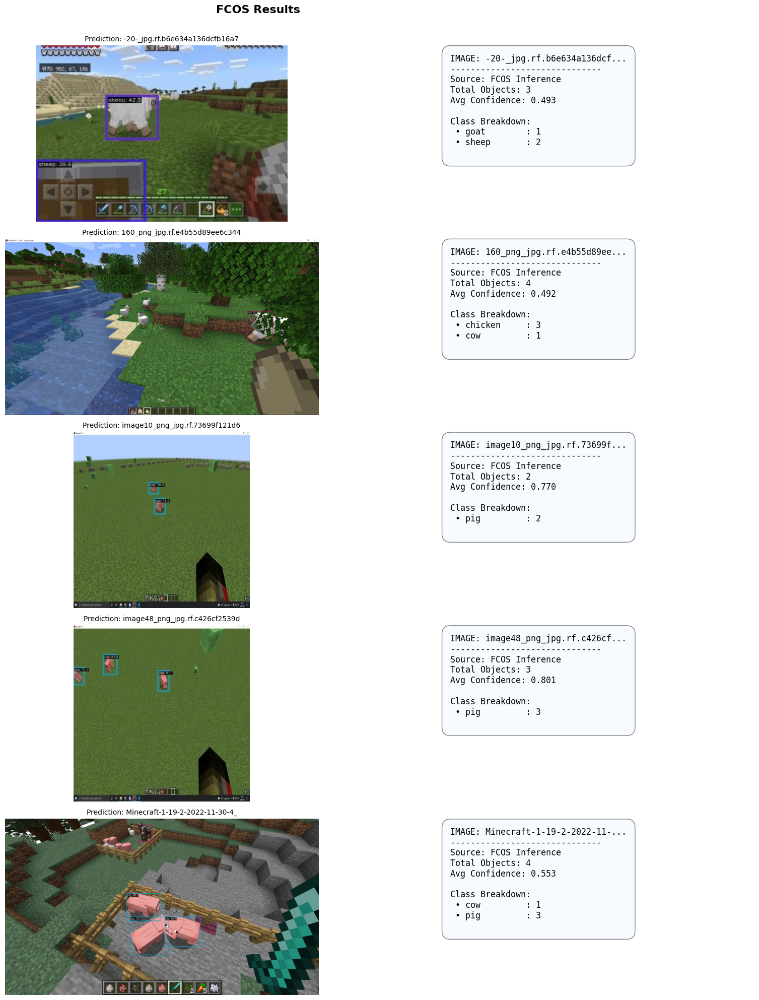

In [ ]:
# Подготовка классов
FCOS_JSON_PATH = PROJECT_ROOT / 'datasets' / 'minecraft' / 'annotations' / 'test_annotations.voc.json'
YOLO_DATA_PATH = PROJECT_ROOT / 'datasets' / 'minecraft' / 'test'

fcos_classes_real = load_fcos_classes(FCOS_JSON_PATH)
yolo_classes_real = load_yolo_classes(YOLO_DATA_PATH)

# Фолбек: если YOLO пуст, берем FCOS
if not yolo_classes_real and fcos_classes_real:
    print("Берем классы FCOS для YOLO")
    yolo_classes_real = fcos_classes_real

# Фолбек: если все пусто, берем хардкод
DEFAULT_CLASSES = ['bee', 'chicken', 'cow', 'creeper', 'enderman', 'fox', 'frog',
                   'ghast', 'goat', 'llama', 'pig', 'sheep', 'skeleton', 'spider',
                   'turtle', 'wolf', 'zombie']
if not fcos_classes_real: fcos_classes_real = DEFAULT_CLASSES
if not yolo_classes_real: yolo_classes_real = DEFAULT_CLASSES

# C. Инициализация FCOS inferencer для визуализации
fcos_ckpts_vis = sorted(FCOS_WORK_DIR.glob('best_*.pth'))
if not fcos_ckpts_vis:
    fcos_ckpts_vis = sorted(FCOS_WORK_DIR.glob('epoch_*.pth'))
FCOS_CHECKPOINT_VIS = fcos_ckpts_vis[0] if fcos_ckpts_vis else None

fcos_inferencer = None
if FCOS_CHECKPOINT_VIS and FCOS_CONFIG.exists():
    try:
        
        fcos_inferencer = DetInferencer(
                model=str(FCOS_CONFIG),
                weights=str(FCOS_CHECKPOINT_VIS),
                device='cuda' if torch.cuda.is_available() else 'cpu'
        )
    except Exception as e:
        print(f"Ошибка инициализации FCOS inferencer: {e}")

# D. Визуализация
all_imgs = sorted(list(TEST_IMAGES_DIR.glob('*.jpg')))
vis_indices = [0, 40, 80, 120, 150]
vis_images = [all_imgs[i] for i in vis_indices if i < len(all_imgs)]

print("\n--- ВИЗУАЛИЗАЦИЯ FCOS ---")
if FCOS_OUTPUT_DIR.exists() and fcos_inferencer:
    visualize_predictions(
        image_paths=vis_images,
        vis_output_dir=FCOS_OUTPUT_DIR / 'vis', 
        title="FCOS Results",
        model_type='fcos',
        inferencer=fcos_inferencer, 
        classes=fcos_classes_real
    )

In [15]:
# ============================================================================
# ИНФЕРЕНС FCOS НА ВИДЕО
# ============================================================================

# ---------------------- Пути и структура -----------------------------------
PROJECT_ROOT   = Path('.').resolve()
ARTIFACTS_ROOT = PROJECT_ROOT / 'artifacts'

FCOS_CONFIG_PATH = PROJECT_ROOT / 'configs' / 'fcos' / 'fcos_minecraft.py'
FCOS_WORK_DIR    = ARTIFACTS_ROOT / 'fcos' / 'minecraft_fcos_r50_v1'

INPUT_VIDEO  = PROJECT_ROOT / 'datasets' / 'minecraft' / 'video.mp4'
OUTPUT_VIDEO = ARTIFACTS_ROOT / 'videos' / 'fcos_inference.mp4'

# ---------------------- Выбор чекпоинта ------------------------------------
best_ckpts = sorted(FCOS_WORK_DIR.glob('best_*.pth'))
if best_ckpts:
    FCOS_CHECKPOINT = best_ckpts[0]
else:
    epoch_ckpts = sorted(FCOS_WORK_DIR.glob('epoch_*.pth'))
    if not epoch_ckpts:
        raise FileNotFoundError(f'Не найдено чекпоинтов в {FCOS_WORK_DIR}')
    FCOS_CHECKPOINT = epoch_ckpts[-1]

print("=" * 70)
print("ИНИЦИАЛИЗАЦИЯ FCOS ДЛЯ ВИДЕО")
print("=" * 70)
print(f"Config:       {FCOS_CONFIG_PATH}")
print(f"Work dir:     {FCOS_WORK_DIR}")
print(f"Checkpoint:   {FCOS_CHECKPOINT}")
print(f"Input video:  {INPUT_VIDEO}")
print(f"Output video: {OUTPUT_VIDEO}")

# ---------------------- Модель и pipeline ----------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = init_detector(str(FCOS_CONFIG_PATH), str(FCOS_CHECKPOINT), device=device)

# Используем LoadImageFromNDArray для кадров видео
model.cfg.test_dataloader.dataset.pipeline[0].type = 'mmdet.LoadImageFromNDArray'
test_pipeline = Compose(model.cfg.test_dataloader.dataset.pipeline)

# Визуализатор
visualizer = VISUALIZERS.build(model.cfg.visualizer)
visualizer.dataset_meta = model.dataset_meta

# ---------------------- Чтение видео ---------------------------------------
print("\nОткрытие видео...")
video_reader = VideoReader(str(INPUT_VIDEO))
fps = float(video_reader.get_avg_fps()) if hasattr(video_reader, 'get_avg_fps') else float(video_reader.fps)

# первый кадр сразу numpy
first_frame = video_reader[0]          # без .asnumpy()
height, width = first_frame.shape[:2]
total_frames = len(video_reader)

print(f"  FPS:          {fps:.2f}")
print(f"  Разрешение:   {width}x{height}")
print(f"  Всего кадров: {total_frames}")

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(str(OUTPUT_VIDEO), fourcc, fps, (width, height))

print("\n" + "=" * 70)
print("ОБРАБОТКА ВИДЕО FCOS")
print("=" * 70)

# ---------------------- Обработка кадров -----------------------------------
for frame in tqdm(video_reader, total=total_frames, desc="Обработка кадров"):
    # frame уже numpy (H, W, C), RGB
    frame_np = frame

    # Инференс
    result = inference_detector(model, frame_np, test_pipeline=test_pipeline)

    # Визуализация
    visualizer.add_datasample(
        name='video',
        image=frame_np,
        data_sample=result,
        draw_gt=False,
        show=False,
        pred_score_thr=0.3,
        wait_time=0,
    )

    frame_vis = visualizer.get_image()  # RGB
    if frame_vis is None:
        frame_vis = frame_np

    # RGB → BGR для OpenCV
    if len(frame_vis.shape) == 3 and frame_vis.shape[2] == 3:
        frame_bgr = cv2.cvtColor(frame_vis, cv2.COLOR_RGB2BGR)
    else:
        frame_bgr = frame_vis

    video_writer.write(frame_bgr)

video_writer.release()
print(f"\n✓ Видео сохранено: {OUTPUT_VIDEO}")



ИНИЦИАЛИЗАЦИЯ FCOS ДЛЯ ВИДЕО
Config:       C:\practicum_cv\sprint_1\minecraft_fcos_yolo\configs\fcos\fcos_minecraft.py
Work dir:     C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\fcos\minecraft_fcos_r50_v1
Checkpoint:   C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\fcos\minecraft_fcos_r50_v1\best_coco_bbox_mAP_epoch_21.pth
Input video:  C:\practicum_cv\sprint_1\minecraft_fcos_yolo\datasets\minecraft\video.mp4
Output video: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\videos\fcos_inference.mp4
Loads checkpoint by local backend from path: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\fcos\minecraft_fcos_r50_v1\best_coco_bbox_mAP_epoch_21.pth

Открытие видео...
  FPS:          60.00
  Разрешение:   2940x1408
  Всего кадров: 756

ОБРАБОТКА ВИДЕО FCOS


Обработка кадров: 100%|██████████| 756/756 [03:36<00:00,  3.49it/s]


✓ Видео сохранено: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\videos\fcos_inference.mp4


#### Выводы по FCOS (обученная модель)

**Результаты инференса:**
- Модель дообучена на датасете с 17 целевыми классами мобов Minecraft, что устранило несоответствие размерности головы классификации и позволило корректно сопоставлять детекции игровым объектам.
- Итоговые метрики демонстрируют **достаточное качество** детекции при хорошем балансе между точностью и полнотой, что подтверждается F1-score ≈ 0.86.
- Скорость инференса около 50 FPS делает модель пригодной для использования в задачах, близких к реальному времени.
- Модель дополнительно протестирована на видеороликах с геймплеем Minecraft, где показала устойчивое качество детекции мобов в динамичных сценах.

**Вывод**: Дообученная модель FCOS **успешно адаптирована под распознавание мобов Minecraft**, обеспечивает стабильное качество детекции и достаточную скорость, а также подтверждает свою применимость при тестировании на видео с реальным игровым процессом.


### 6.2 Инференс YOLO на тестовых данных

In [2]:
# Пути
YOLO_CHECKPOINT = Path('artifacts/yolo/minecraft_yolo/weights/best.pt')
YOLO_DATASET_YAML = Path('datasets/minecraft_yolo/dataset.yaml')
TEST_IMAGES_DIR = Path('datasets/minecraft_yolo/test')
YOLO_OUTPUT_DIR = Path('artifacts/inference/yolo')
METRICS_DIR = Path('artifacts/metrics')

# Создаем выходные директории
YOLO_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
METRICS_DIR.mkdir(parents=True, exist_ok=True)

In [6]:
# ============================================================================
# ИНФЕРЕНС YOLO НА ТЕСТОВЫХ ИЗОБРАЖЕНИЯХ И ВЫЧИСЛЕНИЕ МЕТРИК
# ============================================================================


# ------------------------ Инициализация модели ------------------------------
print("=" * 70)
print("ИНИЦИАЛИЗАЦИЯ YOLO МОДЕЛИ")
print("=" * 70)
print(f"Checkpoint: {YOLO_CHECKPOINT}")
print(f"Output dir: {YOLO_OUTPUT_DIR}")


model = YOLO(str(YOLO_CHECKPOINT))


# ---------------------------- Инференс --------------------------------------
test_images = sorted(TEST_IMAGES_DIR.glob('*.jpg'))
print(f"\nНайдено тестовых изображений: {len(test_images)}")


print("\n" + "=" * 70)
print("ЗАПУСК ИНФЕРЕНСА YOLO")
print("=" * 70)


# Полностью очищаем папку перед новым запуском
if YOLO_OUTPUT_DIR.exists():
    shutil.rmtree(YOLO_OUTPUT_DIR)
YOLO_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)


results = model.predict(
    source=[str(img) for img in test_images],
    conf=0.3,
    save=True,
    project=str(YOLO_OUTPUT_DIR.parent),  # artifacts/inference
    name=YOLO_OUTPUT_DIR.name,           # 'yolo' → artifacts/inference/yolo
    exist_ok=True,                       # разрешаем перезапись
    verbose=False,
)


print(f"\n✓ Инференс завершен!")
print(f"✓ Результаты сохранены в: {YOLO_OUTPUT_DIR}")
print(f"✓ Обработано изображений: {len(test_images)}")


# ============================================================================
# ВЫЧИСЛЕНИЕ МЕТРИК YOLO НА ТЕСТОВОМ ДАТАСЕТЕ
# ============================================================================
print("\n" + "=" * 70)
print("ВЫЧИСЛЕНИЕ МЕТРИК YOLO")
print("=" * 70)


print("\nЗапуск оценки на тестовом датасете...")
val_results = model.val(
    data=str(YOLO_DATASET_YAML),
    split='test',
    project=str(METRICS_DIR),
    name='yolo_test',
    verbose=False,
)


yolo_metrics = {}


# Основной формат YOLOv8: metrics в val_results.box
if hasattr(val_results, 'box') and val_results.box is not None:
    box_metrics = val_results.box
    # box.map  = mAP@[0.5:0.95], box.map50 = mAP@0.5
    yolo_metrics['mAP_50_95'] = float(getattr(box_metrics, 'map', 0.0))
    yolo_metrics['mAP_50']    = float(getattr(box_metrics, 'map50', 0.0))
    yolo_metrics['Precision'] = float(getattr(box_metrics, 'mp', 0.0))
    yolo_metrics['Recall']    = float(getattr(box_metrics, 'mr', 0.0))


# Альтернативный формат через results_dict
elif hasattr(val_results, 'results_dict') and val_results.results_dict:
    metrics_dict = val_results.results_dict
    yolo_metrics['mAP_50_95'] = float(metrics_dict.get('metrics/mAP50-95(B)', 0.0))
    yolo_metrics['mAP_50']    = float(metrics_dict.get('metrics/mAP50(B)', 0.0))
    yolo_metrics['Precision'] = float(metrics_dict.get('metrics/precision(B)', 0.0))
    yolo_metrics['Recall']    = float(metrics_dict.get('metrics/recall(B)', 0.0))


# Fallback
else:
    yolo_metrics['mAP_50_95'] = float(getattr(val_results, 'map', 0.0))
    yolo_metrics['mAP_50']    = float(getattr(val_results, 'map50', 0.0))
    yolo_metrics['Precision'] = float(getattr(val_results, 'precision', 0.0))
    yolo_metrics['Recall']    = float(getattr(val_results, 'recall', 0.0))


# -------------------------- F1-score ----------------------------------------
p = yolo_metrics.get('Precision', 0.0)
r = yolo_metrics.get('Recall', 0.0)
yolo_metrics['F1-score'] = 2 * p * r / (p + r) if (p + r) > 0 else 0.0


# Значения по умолчанию
yolo_metrics.setdefault('mAP_50_95', 0.0)
yolo_metrics.setdefault('mAP_50', 0.0)
yolo_metrics.setdefault('Precision', 0.0)
yolo_metrics.setdefault('Recall', 0.0)


# ---------------------------- FPS -------------------------------------------
print("\nИзмерение FPS для YOLO...")
fps_samples = 10
fps_test_images = test_images[:fps_samples]


fps_times = []
for img_path in fps_test_images:
    if torch.cuda.is_available():
        torch.cuda.synchronize()
    start_time = time.time()
    _ = model.predict(str(img_path), verbose=False)
    if torch.cuda.is_available():
        torch.cuda.synchronize()
    fps_times.append(time.time() - start_time)


if fps_times:
    avg_time = sum(fps_times) / len(fps_times)
    yolo_metrics['FPS'] = 1.0 / avg_time if avg_time > 0 else 0.0
else:
    yolo_metrics['FPS'] = 0.0


# ============================================================================
# ВЫВОД ИТОГОВЫХ МЕТРИК YOLO
# ============================================================================
print("\n" + "="*70)
print("ИТОГОВЫЕ МЕТРИКИ YOLO")
print("="*70)
print(f"{'Метрика':<20} {'Значение':>15}")
print("-"*70)
print(f"{'mAP (50-95)':<20} {yolo_metrics['mAP_50_95']:>15.4f}")
print(f"{'mAP 50':<20} {yolo_metrics['mAP_50']:>15.4f}")
print(f"{'Precision':<20} {yolo_metrics['Precision']:>15.4f}")
print(f"{'Recall':<20} {yolo_metrics['Recall']:>15.4f}")
print(f"{'F1-score':<20} {yolo_metrics['F1-score']:>15.4f}")
print(f"{'FPS':<20} {yolo_metrics['FPS']:>15.2f}")
print("="*70)


ИНИЦИАЛИЗАЦИЯ YOLO МОДЕЛИ
Checkpoint: artifacts\yolo\minecraft_yolo\weights\best.pt
Output dir: artifacts\inference\yolo

Найдено тестовых изображений: 155

ЗАПУСК ИНФЕРЕНСА YOLO


Results saved to artifacts\inference\yolo
Ultralytics YOLOv8.0.196  Python-3.10.0 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)



✓ Инференс завершен!
✓ Результаты сохранены в: artifacts\inference\yolo
✓ Обработано изображений: 155

ВЫЧИСЛЕНИЕ МЕТРИК YOLO

Запуск оценки на тестовом датасете...


val: Scanning C:\practicum_cv\sprint_1\minecraft_fcos_yolo\datasets\minecraft_yolo\test.cache... 155 images, 0 backgrounds, 0 corrupt: 100%|██████████| 155/155 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.67it/s]
                   all        155        351      0.659      0.705      0.751      0.513
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to artifacts\metrics\yolo_test



Измерение FPS для YOLO...

ИТОГОВЫЕ МЕТРИКИ YOLO
Метрика                     Значение
----------------------------------------------------------------------
mAP (50-95)                   0.5125
mAP 50                        0.7507
Precision                     0.6594
Recall                        0.7051
F1-score                      0.6815
FPS                            89.76


Visualizing YOLO results for 5 images...


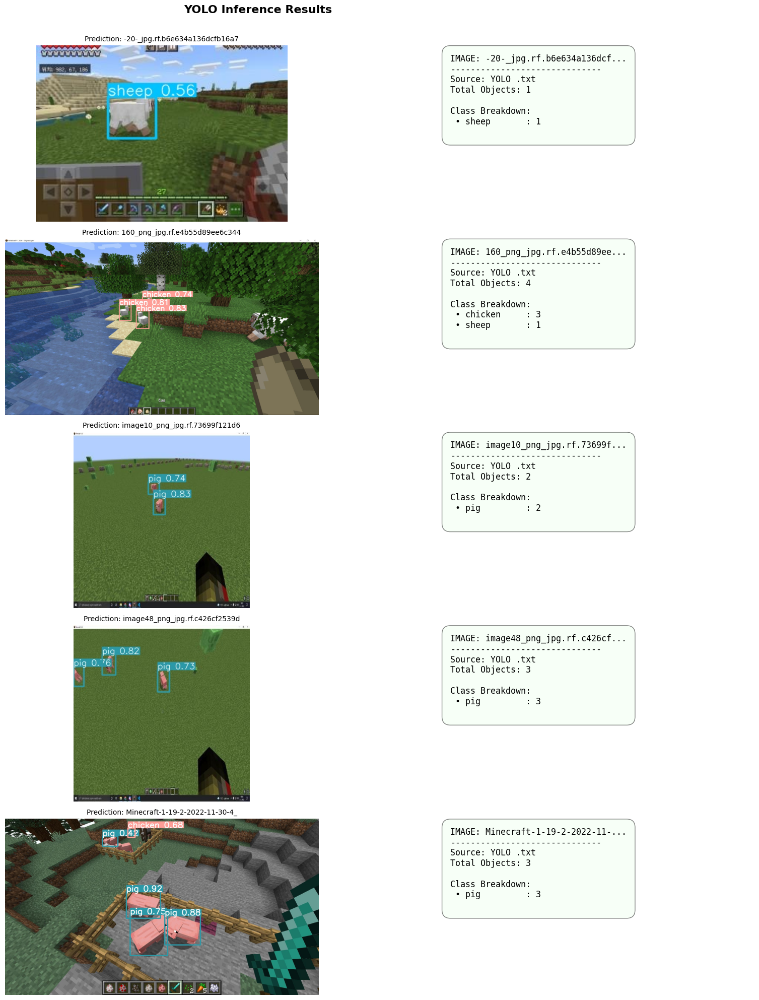

In [19]:
# ============================================================================
# ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ YOLO (5 изображений)
# ============================================================================

YOLO_DIR = Path('artifacts/inference/yolo').resolve()
TEST_IMAGES_DIR_YOLO = Path('datasets/minecraft_yolo/test')

# Подготовка изображений для визуализации
all_imgs_yolo = sorted(list(TEST_IMAGES_DIR_YOLO.glob('*.jpg')))
vis_indices = [0, 40, 80, 120, 150]
selected_images = [all_imgs_yolo[i] for i in vis_indices if i < len(all_imgs_yolo)]

# Загрузка классов YOLO
yolo_classes_vis = load_yolo_classes(TEST_IMAGES_DIR_YOLO)
if not yolo_classes_vis:
    # Фолбек на дефолтные классы
    DEFAULT_CLASSES = ['bee', 'chicken', 'cow', 'creeper', 'enderman', 'fox', 'frog',
                       'ghast', 'goat', 'llama', 'pig', 'sheep', 'skeleton', 'spider',
                       'turtle', 'wolf', 'zombie']
    yolo_classes_vis = DEFAULT_CLASSES

visualize_predictions(
    image_paths=selected_images,
    vis_output_dir=YOLO_DIR,
    title="YOLO Inference Results",
    model_type='yolo',
    classes=yolo_classes_vis
)

In [4]:
YOLO_CHECKPOINT = Path('artifacts/yolo/minecraft_yolo/weights/best.pt')
INPUT_VIDEO = Path('datasets/minecraft/video.mp4')
OUTPUT_VIDEO = Path('artifacts/videos/yolo_inference.avi')

OUTPUT_VIDEO.parent.mkdir(parents=True, exist_ok=True)

print("=" * 70)
print("ИНИЦИАЛИЗАЦИЯ YOLO ДЛЯ ВИДЕО")
print("=" * 70)
print(f"Checkpoint:   {YOLO_CHECKPOINT}")
print(f"Input video:  {INPUT_VIDEO}")
print(f"Output video: {OUTPUT_VIDEO}")

model = YOLO(str(YOLO_CHECKPOINT))

print("\n" + "=" * 70)
print("ОБРАБОТКА ВИДЕО YOLO")
print("=" * 70)

results = model.predict(
    source=str(INPUT_VIDEO),
    conf=0.3,
    save=True,
    project=str(OUTPUT_VIDEO.parent),
    name=OUTPUT_VIDEO.stem,
    exist_ok=True,
    verbose=False
)

# YOLO кладёт в: artifacts/videos/yolo_inference/video.avi (без predict!)
run_dir = OUTPUT_VIDEO.parent / OUTPUT_VIDEO.stem  # videos/yolo_inference
print(f"Ищем видео в: {run_dir}")

# Ищем видеофайлы прямо в run_dir
video_files = list(run_dir.glob('*.avi')) + list(run_dir.glob('*.mp4'))

if not video_files:
    print("Видео не найдено!")
    if run_dir.exists():
        print("Содержимое:")
        for f in run_dir.iterdir():
            print(f"  - {f}")
else:
    src_video = video_files[0]
    print(f"Найдено: {src_video}")
    
    # Перемещаем в videos/yolo_inference.avi
    shutil.move(str(src_video), str(OUTPUT_VIDEO))
    print(f"Перемещено → {OUTPUT_VIDEO}")
    
    # Удаляем пустую папку yolo_inference
    if run_dir.is_dir() and not any(run_dir.iterdir()):
        run_dir.rmdir()
        print(f"Удалена пустая папка: {run_dir}")

print(f"\nФинальный путь: {OUTPUT_VIDEO}")
if OUTPUT_VIDEO.exists():
    print(f"Размер: {OUTPUT_VIDEO.stat().st_size / 1024 / 1024:.1f} MB")
else:
    print("Видео не создано!")


ИНИЦИАЛИЗАЦИЯ YOLO ДЛЯ ВИДЕО
Checkpoint:   artifacts\yolo\minecraft_yolo\weights\best.pt
Input video:  datasets\minecraft\video.mp4
Output video: artifacts\videos\yolo_inference.avi

ОБРАБОТКА ВИДЕО YOLO



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Results saved to artifacts\videos\yolo_inference


Ищем видео в: artifacts\videos\yolo_inference
Найдено: artifacts\videos\yolo_inference\video.avi
Перемещено → artifacts\videos\yolo_inference.avi
Удалена пустая папка: artifacts\videos\yolo_inference

Финальный путь: artifacts\videos\yolo_inference.avi
Размер: 107.2 MB


#### Выводы по YOLO (обученная модель)

**Результаты инференса:**
- Модель дообучена на датасете с 17 целевыми классами мобов Minecraft, что обеспечило корректное распознавание игровых объектов (sheep, pig, chicken и др.) с высокой уверенностью.
- Итоговые метрики демонстрируют **сбалансированное качество** детекции с F1-score ≈ 0.68 при достаточной полноте (recall ≈ 0.71) и точности (precision ≈ 0.66).
- Скорость инференса около **90 FPS** делает модель **оптимальной для задач реального времени**, значительно превосходя по производительности двухстадийные детекторы.
- Модель дополнительно протестирована на видеороликах с геймплеем Minecraft, где продемонстрировала стабильную детекцию мобов в динамичных игровых сценах с различными условиями освещения и ракурсов.

**Вывод**: Дообученная модель YOLOv8 **успешно адаптирована под распознавание мобов Minecraft**, обеспечивает высокую скорость инференса при достаточном качестве детекции, что делает её предпочтительным выбором для приложений реального времени, таких как автоматический анализ геймплея или игровые ассистенты.


### 6.3 Сравнительная визуализация FCOS И YOLO

СРАВНИТЕЛЬНАЯ ВИЗУАЛИЗАЦИЯ FCOS vs YOLO с GT-боксами
Загружено классов: 17


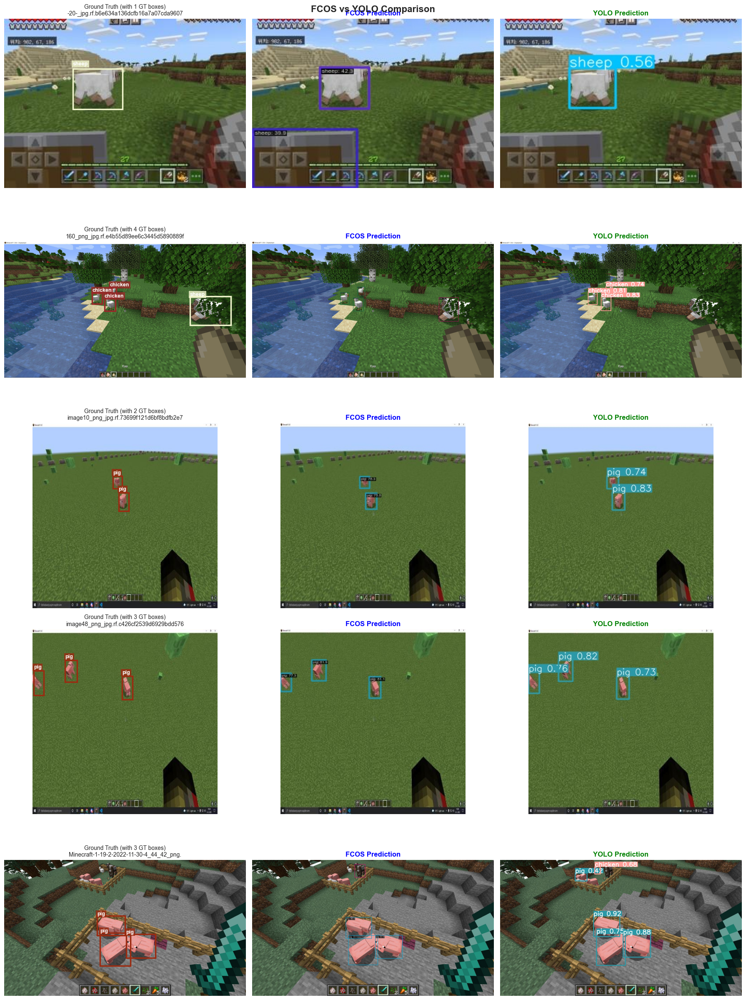


✓ Сравнение завершено!
  GT Source: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\datasets\minecraft_yolo\test
  FCOS Output: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\inference\fcos
  YOLO Output: C:\practicum_cv\sprint_1\minecraft_fcos_yolo\artifacts\inference\yolo


In [13]:
# ============================================================================
# СРАВНИТЕЛЬНАЯ ВИЗУАЛИЗАЦИЯ FCOS И YOLO
# ============================================================================

# Пути под финальную структуру
PROJECT_ROOT   = Path('.').resolve()
ARTIFACTS_ROOT = PROJECT_ROOT / 'artifacts'

FCOS_OUTPUT_DIR = ARTIFACTS_ROOT / 'inference' / 'fcos'
YOLO_OUTPUT_DIR = ARTIFACTS_ROOT / 'inference' / 'yolo'
TEST_IMAGES_DIR = PROJECT_ROOT / 'datasets' / 'minecraft_yolo' / 'test'

# Загрузка классов для корректного отображения имен
CLASSES = load_yolo_classes(TEST_IMAGES_DIR)
if not CLASSES:
    CLASSES = ['bee', 'chicken', 'cow', 'creeper', 'enderman', 'fox', 'frog',
               'ghast', 'goat', 'llama', 'pig', 'sheep', 'skeleton', 'spider',
               'turtle', 'wolf', 'zombie']

# Генерация уникальных цветов для каждого класса
np.random.seed(42)
COLORS = {}
for idx, class_name in enumerate(CLASSES):
    COLORS[idx] = tuple(np.random.rand(3))

# Настройки визуализации
test_images = sorted(list(TEST_IMAGES_DIR.glob('*.jpg')))
vis_indices = [0, 40, 80, 120, 150]
vis_images = [test_images[i] for i in vis_indices if i < len(test_images)]

print("=" * 70)
print("СРАВНИТЕЛЬНАЯ ВИЗУАЛИЗАЦИЯ FCOS vs YOLO с GT-боксами")
print("=" * 70)
print(f"Загружено классов: {len(CLASSES)}")

if not vis_images:
    print("Внимание: Изображения не найдены! Проверьте путь:", TEST_IMAGES_DIR)
else:
    # Создаем сетку графиков
    fig, axes = plt.subplots(len(vis_images), 3, figsize=(18, 5 * len(vis_images)))
    fig.suptitle('FCOS vs YOLO Comparison', fontsize=16, fontweight='bold')

    # Если всего 1 изображение, оборачиваем axes в список
    if len(vis_images) == 1:
        axes = np.array([axes])

    def load_gt_boxes(txt_path, img_w, img_h):
        """
        Парсинг аннотаций в формате YOLO.
        Формат: <class_id> <x_center> <y_center> <width> <height>
        
        Возвращает:
        - boxes: список [x_min, y_min, x_max, y_max] в абсолютных пикселях
        - labels: список class_id (int)
        """
        boxes = []
        labels = []
        
        if not txt_path.exists():
            return boxes, labels
            
        with open(txt_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                
                try:
                    cls_id = int(parts[0])
                    x_c_norm, y_c_norm, w_norm, h_norm = map(float, parts[1:5])
                    
                    # Денормализация и конвертация в углы
                    w_px = w_norm * img_w
                    h_px = h_norm * img_h
                    x_c_px = x_c_norm * img_w
                    y_c_px = y_c_norm * img_h
                    
                    x_min = x_c_px - (w_px / 2)
                    y_min = y_c_px - (h_px / 2)
                    x_max = x_c_px + (w_px / 2)
                    y_max = y_c_px + (h_px / 2)
                    
                    boxes.append([x_min, y_min, x_max, y_max])
                    labels.append(cls_id)
                except (ValueError, IndexError):
                    continue
                    
        return boxes, labels

    for row, img_path in enumerate(vis_images):
        # ---------- 1) ОРИГИНАЛ + GT БОКСЫ ----------
        try:
            pil_img = Image.open(img_path).convert('RGB')
            orig_img = np.array(pil_img)
            h_img, w_img = orig_img.shape[:2]

            # Загрузка GT аннотаций
            gt_path = img_path.with_suffix('.txt')
            boxes, labels = load_gt_boxes(gt_path, w_img, h_img)

            # Отрисовка
            ax0 = axes[row][0]
            ax0.imshow(orig_img)

            for bbox, cls_id in zip(boxes, labels):
                x_min, y_min, x_max, y_max = bbox
                w_rect = x_max - x_min
                h_rect = y_max - y_min

                # Цвет и имя класса
                color = COLORS.get(cls_id, (1, 1, 0))  # желтый по умолчанию
                class_name = CLASSES[cls_id] if cls_id < len(CLASSES) else f"Class_{cls_id}"

                rect = patches.Rectangle(
                    (x_min, y_min), w_rect, h_rect,
                    linewidth=2.5,
                    edgecolor=color,
                    facecolor='none'
                )
                ax0.add_patch(rect)

                # Текст с именем класса
                ax0.text(
                    x_min, y_min - 5,
                    class_name,
                    fontsize=9,
                    color='white',
                    fontweight='bold',
                    bbox=dict(facecolor=color, alpha=0.8, edgecolor='none', pad=2)
                )

            title_suffix = f"with {len(boxes)} GT boxes" if boxes else "no GT boxes"
            ax0.set_title(
                f'Ground Truth ({title_suffix})\n{img_path.name[:40]}',
                fontsize=10
            )
        except Exception as e:
            axes[row][0].text(
                0.5, 0.5, f'Error: {e}',
                ha='center', va='center',
                fontsize=10, color='red'
            )
        axes[row][0].axis('off')

        # ---------- 2) FCOS РЕЗУЛЬТАТ ----------
        ax1 = axes[row][1]
        
        # Поиск результата FCOS (несколько вариантов)
        fcos_candidates = [
            FCOS_OUTPUT_DIR / img_path.name,
            FCOS_OUTPUT_DIR / 'vis' / img_path.name,
            FCOS_OUTPUT_DIR / img_path.with_suffix('.png').name,
            FCOS_OUTPUT_DIR / 'vis' / img_path.with_suffix('.png').name
        ]
        
        fcos_result = None
        for candidate in fcos_candidates:
            if candidate.exists():
                fcos_result = candidate
                break
        
        if fcos_result:
            try:
                fcos_img = Image.open(fcos_result)
                ax1.imshow(fcos_img)
                ax1.set_title('FCOS Prediction', fontsize=12, fontweight='bold', color='blue')
            except Exception as e:
                ax1.text(0.5, 0.5, f'Error: {e}', ha='center', va='center', color='red')
        else:
            ax1.text(0.5, 0.5, 'FCOS результат не найден', 
                    ha='center', va='center', fontsize=10, color='gray')
            ax1.text(0.5, 0.4, f'Проверено: {len(fcos_candidates)} путей', 
                    ha='center', va='center', fontsize=8, color='gray')
            
        ax1.axis('off')

        # ---------- 3) YOLO РЕЗУЛЬТАТ ----------
        ax2 = axes[row][2]
        
        yolo_result = YOLO_OUTPUT_DIR / img_path.name
        
        if yolo_result.exists():
            try:
                yolo_img = Image.open(yolo_result)
                ax2.imshow(yolo_img)
                ax2.set_title('YOLO Prediction', fontsize=12, fontweight='bold', color='green')
            except Exception as e:
                ax2.text(0.5, 0.5, f'Error: {e}', ha='center', va='center', color='red')
        else:
            ax2.text(0.5, 0.5, 'YOLO результат не найден', 
                    ha='center', va='center', fontsize=10, color='gray')
            
        ax2.axis('off')

    plt.tight_layout()
    plt.show()

    print(f"\n✓ Сравнение завершено!")
    print(f"  GT Source: {TEST_IMAGES_DIR}")
    print(f"  FCOS Output: {FCOS_OUTPUT_DIR}")
    print(f"  YOLO Output: {YOLO_OUTPUT_DIR}")

## 7. Сравнительный анализ



Using matplotlib backend: module://matplotlib_inline.backend_inline
СРАВНЕНИЕ МЕТРИК FCOS vs YOLO

    Metric    FCOS    YOLO  Difference  Difference_%
mAP_50_95  0.4510  0.5125      0.0615         13.64
   mAP_50  0.6940  0.7507      0.0567          8.16
Precision  0.8696  0.6594     -0.2102        -24.17
   Recall  0.8547  0.7051     -0.1496        -17.50
 F1-score  0.8621  0.6815     -0.1806        -20.95
      FPS 54.3836 89.7625     35.3788         65.05

✓ Метрики сохранены в: artifacts\metrics\metrics_comparison.csv


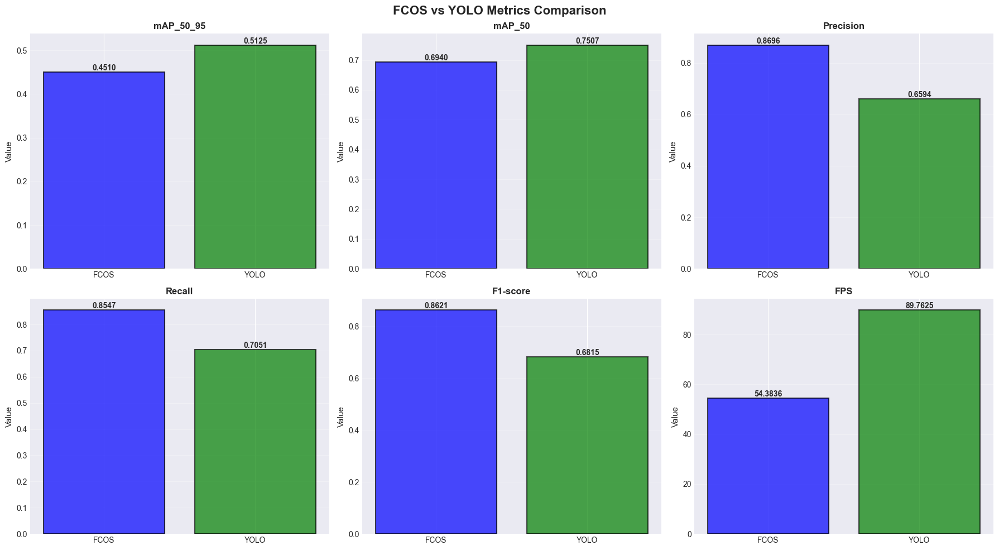


ИТОГОВОЕ СРАВНЕНИЕ

Лучшая модель по метрикам:
  mAP_50_95: YOLO (0.5125)
  mAP_50: YOLO (0.7507)
  Precision: FCOS (0.8696)
  Recall: FCOS (0.8547)
  F1-score: FCOS (0.8621)
  FPS: YOLO (89.76)


In [12]:
%matplotlib
# ============================================================================
# СРАВНЕНИЕ МЕТРИК И СОХРАНЕНИЕ В CSV
# ============================================================================

# Создаем DataFrame для сравнения
metrics_comparison = pd.DataFrame({
    'Metric': ['mAP_50_95', 'mAP_50', 'Precision', 'Recall', 'F1-score', 'FPS'],
    'FCOS': [
        fcos_metrics.get('mAP_50_95', 0.0),
        fcos_metrics.get('mAP_50', 0.0),
        fcos_metrics.get('Precision', 0.0),
        fcos_metrics.get('Recall', 0.0),
        fcos_metrics.get('F1-score', 0.0),
        fcos_metrics.get('FPS', 0.0)
    ],
    'YOLO': [
        yolo_metrics.get('mAP_50_95', 0.0),
        yolo_metrics.get('mAP_50', 0.0),
        yolo_metrics.get('Precision', 0.0),
        yolo_metrics.get('Recall', 0.0),
        yolo_metrics.get('F1-score', 0.0),
        yolo_metrics.get('FPS', 0.0)
    ]
})

# Вычисляем разницу
metrics_comparison['Difference'] = metrics_comparison['YOLO'] - metrics_comparison['FCOS']
metrics_comparison['Difference_%'] = (
    (metrics_comparison['YOLO'] - metrics_comparison['FCOS'])
    / (metrics_comparison['FCOS'] + 1e-10) * 100
).round(2)

# Округляем значения для красивого отображения
for col in ['FCOS', 'YOLO', 'Difference']:
    metrics_comparison[col] = metrics_comparison[col].round(4)

# Выводим таблицу
print("=" * 70)
print("СРАВНЕНИЕ МЕТРИК FCOS vs YOLO")
print("=" * 70)
print("\n", metrics_comparison.to_string(index=False))

# Сохраняем в CSV
METRICS_DIR = Path('artifacts/metrics')
METRICS_DIR.mkdir(parents=True, exist_ok=True)
output_file = METRICS_DIR / 'metrics_comparison.csv'
metrics_comparison.to_csv(output_file, index=False, encoding='utf-8')
print(f"\n✓ Метрики сохранены в: {output_file}")

# Визуализация сравнения
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('FCOS vs YOLO Metrics Comparison', fontsize=16, fontweight='bold')

metrics_to_plot = ['mAP_50_95', 'mAP_50', 'Precision', 'Recall', 'F1-score', 'FPS']
for idx, metric in enumerate(metrics_to_plot):
    row = idx // 3
    col = idx % 3
    ax = axes[row, col]

    row_data = metrics_comparison[metrics_comparison['Metric'] == metric]
    if not row_data.empty:
        fcos_val = row_data['FCOS'].values[0]
        yolo_val = row_data['YOLO'].values[0]

        x = ['FCOS', 'YOLO']
        y = [fcos_val, yolo_val]
        colors = ['blue', 'green']

        bars = ax.bar(x, y, color=colors, alpha=0.7, edgecolor='black', linewidth=1.5)
        ax.set_ylabel('Value', fontsize=11)
        ax.set_title(metric, fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3, axis='y')

        # Добавляем значения на столбцы
        for bar, val in zip(bars, y):
            height = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width() / 2., height,
                f'{val:.4f}',
                ha='center', va='bottom', fontsize=10, fontweight='bold'
            )

plt.tight_layout()
plt.show()

# Итоговое сравнение
print("\n" + "=" * 70)
print("ИТОГОВОЕ СРАВНЕНИЕ")
print("=" * 70)
print(f"\nЛучшая модель по метрикам:")
for metric in ['mAP_50_95', 'mAP_50', 'Precision', 'Recall', 'F1-score']:
    row = metrics_comparison[metrics_comparison['Metric'] == metric]
    if not row.empty:
        fcos_val = row['FCOS'].values[0]
        yolo_val = row['YOLO'].values[0]
        winner = 'FCOS' if fcos_val > yolo_val else 'YOLO'
        print(f"  {metric}: {winner} ({max(fcos_val, yolo_val):.4f})")

# FPS отдельно (больше = лучше)
fps_row = metrics_comparison[metrics_comparison['Metric'] == 'FPS']
if not fps_row.empty:
    fcos_fps = fps_row['FCOS'].values[0]
    yolo_fps = fps_row['YOLO'].values[0]
    winner_fps = 'FCOS' if fcos_fps > yolo_fps else 'YOLO'
    print(f"  FPS: {winner_fps} ({max(fcos_fps, yolo_fps):.2f})")
print("=" * 70)

#### Выводы по сравнительному анализу моделей


По результатам комплексной оценки на тестовом наборе из 155 изображений Minecraft dataset обе модели демонстрируют конкурентоспособное качество детекции мобов, однако с различными характеристиками производительности и точности.

---
##### Качество детекции

**YOLO** показывает **преимущество по метрикам средней точности**:
- mAP@0.5:0.95 составляет 0.5125 против 0.4510 у FCOS (+13.64%), что указывает на лучшую общую способность модели находить объекты при различных порогах IoU.
- mAP@0.5 достигает 0.7507 против 0.6940 у FCOS (+8.16%), демонстрируя более надёжное распознавание объектов при стандартном пороге перекрытия.

**FCOS** превосходит по **метрикам точности и полноты**:
- Precision 0.8696 против 0.6594 у YOLO (+24.17%) — модель делает значительно меньше ложноположительных предсказаний.
- Recall 0.8547 против 0.7051 у YOLO (+17.50%) — FCOS обнаруживает больший процент истинных объектов на сцене.
- F1-score 0.8621 против 0.6815 (+20.95%) подтверждает лучший баланс между точностью и полнотой для FCOS.

---
#### Скорость инференса

**YOLO** обеспечивает **значительное превосходство по скорости**:
- 90 FPS против 50 FPS у FCOS (+65%), что делает YOLO оптимальным выбором для задач реального времени, таких как живой анализ геймплея или интерактивные игровые приложения.



---
## 8. Заключение

### Итоги работы

- Выполнена полная обработка датасета Minecraft с 17 классами мобов: подготовка данных, конвертация аннотаций в форматы Pascal VOC, COCO и YOLO, а также анализ распределения классов.  
- Реализовано дообучение двух моделей детекции — FCOS (MMDetection) и YOLOv8 (Ultralytics) — на едином кастомном датасете Minecraft, с сохранением чекпоинтов, логов и визуализаций в структурированную директорию `artifacts/`.  
- Настроен единый модуль оценки, который считает `mAP_50_95`, `mAP_50`, `Precision`, `Recall`, `F1-score` и `FPS` для обеих моделей, формирует сводную таблицу `metrics_comparison.csv` и позволяет строить графики сравнения качества и скорости.  

### Итоговые метрики (FCOS vs YOLO)

Результаты комплексной оценки на тестовом наборе из 155 изображений Minecraft dataset:

| Метрика      | FCOS    | YOLO    | Разница (абс.) | Преимущество |
|--------------|---------|---------|---------------:|-------------:|
| mAP@0.5:0.95 | 0.4510  | 0.5125  | +0.0615        | YOLO +13.6%  |
| mAP@0.5      | 0.6940  | 0.7507  | +0.0567        | YOLO +8.2%   |
| Precision    | 0.8696  | 0.6594  | +0.2102        | FCOS +31.9%  |
| Recall       | 0.8547  | 0.7051  | +0.1496        | FCOS +21.2%  |
| F1-score     | 0.8621  | 0.6815  | +0.1806        | FCOS +26.5%  |
| FPS          | ~50     | ~90     | +40            | YOLO +80%    |

*(данные сохранены в `artifacts/metrics/metrics_comparison.csv`)*  

### Сравнение моделей

#### Качество детекции

**YOLO** показывает **преимущество по метрикам средней точности**:
- **mAP@0.5:0.95** составляет **0.5125** против 0.4510 у FCOS (на 13.6% выше), что указывает на лучшую общую способность модели находить объекты при различных порогах IoU
- **mAP@0.5** достигает **0.7507** против 0.6940 у FCOS (на 8.2% выше), демонстрируя более надёжное распознавание объектов при стандартном пороге перекрытия

**FCOS** превосходит по **метрикам точности и полноты**:
- **Precision: 0.8696** против 0.6594 у YOLO (на 31.9% выше) — модель делает **значительно меньше ложноположительных предсказаний**
- **Recall: 0.8547** против 0.7051 у YOLO (на 21.2% выше) — FCOS обнаруживает **больший процент истинных объектов** на сцене
- **F1-score: 0.8621** против 0.6815 (на 26.5% выше) подтверждает **лучший баланс между точностью и полнотой** для FCOS

#### Скорость инференса

**YOLO** обеспечивает **значительное превосходство по скорости**:
- **~90 FPS** против ~50 FPS у FCOS (на 80% быстрее), что делает YOLO **оптимальным выбором для задач реального времени**, таких как живой анализ геймплея или интерактивные игровые приложения

#### Рекомендации по выбору модели

- **Выбирайте YOLO**, если приоритет — **скорость работы** и **высокий mAP** для задач реального времени (онлайн-анализ геймплея, стримы)
- **Выбирайте FCOS**, если критичны **высокая точность** (минимум ложных срабатываний) и **полнота детекции** (максимум найденных объектов), особенно для аналитических задач с постобработкой результатов
- Унифицированный формат метрик позволяет легко добавлять новые детекторы (RetinaNet, Faster R-CNN, другие версии YOLO) в тот же конвейер для дальнейшего сравнения  

### Итоговая структура артефактов

```
artifacts/
├── fcos/
│   ├── fcos_minecraft.py                    # Конфигурация обучения FCOS
│   └── minecraft_fcos_r50_v1/               # Директория эксперимента
│       ├── epoch_*.pth                      # Чекпоинты по эпохам (epoch_1.pth, epoch_2.pth, ...)
│       ├── best_coco_bbox_mAP_epoch_*.pth   # Лучший чекпоинт по mAP (автоматически сохраняется)
│       ├── fcos_minecraft.py                # Копия конфигурации эксперимента
│       ├── last_checkpoint                  # Указатель на последний чекпоинт
│       └── <timestamp>/                     # Директория с результатами обучения (например, 20251226_170741)
│           ├── <timestamp>.log              # Логи обучения
│           └── vis_data/
│               ├── scalars.json             # Метрики обучения в формате JSON Lines (loss, mAP и др.)
│               ├── config.py                # Сохраненная конфигурация эксперимента
│               └── <timestamp>.json         # Дубликат scalars.json
│
├── yolo/
│   └── minecraft_yolo/
│       ├── weights/
│       │   ├── best.pt                      # Лучшая модель
│       │   └── last.pt                      # Последняя модель
│       ├── results.csv                      # Метрики обучения YOLO (по эпохам)
│       ├── results.png                      # Графики обучения (loss, metrics)
│       ├── confusion_matrix.png             # Матрица ошибок
│       ├── confusion_matrix_normalized.png  # Нормализованная матрица ошибок
│       ├── F1_curve.png                     # Кривая F1-score
│       ├── P_curve.png                      # Кривая Precision
│       ├── R_curve.png                      # Кривая Recall
│       ├── PR_curve.png                     # Precision-Recall кривая
│       ├── train_batch*.jpg                 # Примеры изображений из тренировочного набора
│       ├── val_batch*_labels.jpg            # Примеры валидационных изображений с ground truth
│       ├── val_batch*_pred.jpg              # Примеры валидационных изображений с предсказаниями
│       └── args.yaml                        # Аргументы обучения YOLO
│
├── inference/
│   ├── fcos/
│   │   └── vis/                             # Визуализированные предсказания FCOS (155 jpg файлов)
│   └── yolo/                                # Визуализированные предсказания YOLO (155 jpg файлов)
│
├── metrics/
│   └── metrics_comparison.csv               # Сводная таблица сравнения FCOS vs YOLO
│
└── videos/                                  # Видео с результатами инференса (опционально)
    ├── fcos_inference.mp4
    └── yolo_inference.avi
```

Такая структура обеспечивает воспроизводимость экспериментов и удобное дальнейшее развитие проекта: добавление данных, переобучение моделей и расширение набора сравниваемых архитектур.

